In [1]:
import os
os.environ['KAGGLE_USERNAME'] = "muhammadhisyamkamil"
os.environ['KAGGLE_KEY'] = "b647a83fcf7513c9bfbdd998d2085da3"

In [2]:
!cp -r /kaggle/input/machine-learning-task/tensorflow2/v2/1/artifacts /kaggle/working

In [3]:
!ls /kaggle/working

artifacts


In [4]:
# %%
import os
import cv2
import numpy as np
import pandas as pd
import pickle
import random
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm import tqdm
from glob import glob

# Scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.utils.class_weight import compute_class_weight

# TensorFlow / Keras
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, callbacks, regularizers

import seaborn as sns
from IPython.display import display

2025-12-03 04:53:02.895807: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764737583.119292      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764737583.165703      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

In [5]:
# ==========================================
# 1. SETUP & KONFIGURASI GLOBAL
# ==========================================
RANDOM_STATE = 42
tf.random.set_seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)
random.seed(RANDOM_STATE)

ROOT = Path("/kaggle/input/covidqu")
INFECTION_ROOT = ROOT / "Infection Segmentation Data" / "Infection Segmentation Data"
ARTIFACTS = Path("./artifacts")
ARTIFACTS.mkdir(parents=True, exist_ok=True)

TARGET_SIZE = (224, 224)
IMG_EXT = (".png", ".jpg", ".jpeg")
CLASSES = {0: "COVID-19", 1: "Non-COVID", 2: "Normal"}

print(f"✅ Setup Ready. TF Version: {tf.__version__}")

✅ Setup Ready. TF Version: 2.18.0


In [6]:

# %%
# ==========================================
# 2. RAW-STYLE PREPROCESSING FUNCTIONS
# ==========================================
def apply_clahe(img01):
    """
    Meningkatkan kontras lokal pada gambar X-ray.
    Input: float32 [0..1], Output: float32 [0..1]
    """
    u8 = (img01 * 255).astype(np.uint8)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    eq = clahe.apply(u8)
    return eq.astype(np.float32) / 255.0

def heuristic_lung_crop(img01, padding=20):
    """
    Otomatis mencari area paru-paru dan melakukan cropping agar model fokus.
    Menggunakan teknik thresholding & connected components.
    """
    H, W = img01.shape
    u8 = (img01 * 255).astype(np.uint8)
    
    _, m = cv2.threshold(u8, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    num, lab = cv2.connectedComponents(m)
    if num <= 1:
        return cv2.resize(img01, TARGET_SIZE, interpolation=cv2.INTER_AREA)
    
    areas = sorted(
        [(k, int((lab == k).sum())) for k in range(1, num)],
        key=lambda x: x[1],
        reverse=True
    )
    keep_areas = areas[:2]
    mask = np.zeros_like(m, dtype=np.uint8)
    for k, _ in keep_areas:
        mask[lab == k] = 255
        
    ys, xs = np.where(mask > 0)
    if len(xs) == 0 or len(ys) == 0:
        return cv2.resize(img01, TARGET_SIZE, interpolation=cv2.INTER_AREA)
    
    x0, x1 = max(0, xs.min() - padding), min(W - 1, xs.max() + padding)
    y0, y1 = max(0, ys.min() - padding), min(H - 1, ys.max() + padding)
    crop = img01[y0:y1+1, x0:x1+1]
    return cv2.resize(crop, TARGET_SIZE, interpolation=cv2.INTER_AREA)

def load_and_preprocess(path, size=TARGET_SIZE):
    """Pipeline utama: Load -> Resize -> CLAHE -> Lung Crop -> Resize."""
    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError(path)
    img = cv2.resize(img, size, interpolation=cv2.INTER_AREA)
    img = img.astype(np.float32) / 255.0
    img = apply_clahe(img)
    img = heuristic_lung_crop(img)
    return img

In [7]:
# %%
# ==========================================
# 3. DATA LOADING & SPLITTING
# ==========================================
def build_metadata(base_dir: Path):
    rows = []
    for split in ["Train", "Val", "Test"]:
        split_dir = base_dir / split
        if not split_dir.exists():
            continue
        for class_dir in split_dir.iterdir():
            if not class_dir.is_dir():
                continue
            label_str = class_dir.name
            candidates = [class_dir, class_dir / "images"]
            for folder in candidates:
                if not folder.exists():
                    continue
                for img_path in folder.iterdir():
                    if img_path.suffix.lower() in IMG_EXT:
                        rows.append({
                            "image_path": str(img_path),
                            "label_str": label_str
                        })
    return pd.DataFrame(rows)

meta_path = ARTIFACTS / "metadata.csv"
raw_npz_path = ARTIFACTS / "data_rawstyle.npz"

if meta_path.exists():
    meta = pd.read_csv(meta_path)
else:
    print("📂 Scanning dataset files...")
    meta = build_metadata(INFECTION_ROOT)
    meta.to_csv(meta_path, index=False)

def get_label_int(txt):
    txt = txt.lower()
    if "covid" in txt and "non" not in txt:
        return 0
    if "non" in txt:
        return 1
    return 2

meta['label'] = meta['label_str'].apply(get_label_int)
print(f"Total Images: {len(meta)}")
print(meta['label'].value_counts())

if raw_npz_path.exists():
    print("📦 Loading processed arrays from disk...")
    data = np.load(raw_npz_path, allow_pickle=True)
    X, Y = data['X'], data['Y']
else:
    print("🧪 Preprocessing all images (CLAHE + Heuristic Crop)...")
    X_list, Y_list = [], []
    for _, row in tqdm(meta.iterrows(), total=len(meta)):
        try:
            img = load_and_preprocess(row['image_path'])
            X_list.append(img)
            Y_list.append(row['label'])
        except Exception:
            continue
    X = np.stack(X_list).astype(np.float32)
    Y = np.array(Y_list, dtype=np.int32)
    np.savez_compressed(
        raw_npz_path,
        X=X,
        Y=Y,
        paths=meta['image_path'].values
    )
    print("✅ Arrays saved to", raw_npz_path)

train_val_idx, test_idx = train_test_split(
    np.arange(len(Y)),
    test_size=0.15,
    stratify=Y,
    random_state=RANDOM_STATE
)
train_idx, val_idx = train_test_split(
    train_val_idx,
    test_size=0.176,
    stratify=Y[train_val_idx],
    random_state=RANDOM_STATE
)

print(f"Train: {len(train_idx)} | Val: {len(val_idx)} | Test: {len(test_idx)}")

base_cw = compute_class_weight('balanced', classes=np.unique(Y), y=Y[train_idx])
CLASS_WEIGHTS = dict(enumerate(base_cw))
print("Class Weights (base):", CLASS_WEIGHTS)

Total Images: 5826
label
0    2913
1    1457
2    1456
Name: count, dtype: int64
📦 Loading processed arrays from disk...
Train: 4080 | Val: 872 | Test: 874
Class Weights (base): {0: 0.6666666666666666, 1: 1.3333333333333333, 2: 1.3333333333333333}


In [8]:
# %%
# ==========================================
# 26. MACHINE LEARNING KLASIK:
#     HOG Features + SVM / RandomForest / kNN
#     (berbasis data_rawstyle.npz yang sama
#      dengan pipeline deep learning)
# ==========================================
import numpy as np
import pandas as pd
from pathlib import Path
from tqdm import tqdm
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.feature_selection import SelectKBest, f_classif
from skimage.feature import hog
import joblib

# Pastikan ARTIFACTS & RANDOM_STATE & CLASSES sudah ada dari bagian atas
ARTIFACTS = Path("./artifacts")
ARTIFACTS.mkdir(parents=True, exist_ok=True)

# Muat X,Y dari data_rawstyle.npz (hasil preprocessing raw-style milik DL)
arr_path = raw_npz_path if "raw_npz_path" in globals() else (ARTIFACTS / "data_rawstyle.npz")
data_npz = np.load(arr_path, allow_pickle=True)
X_cl = data_npz["X"].astype(np.float32)   # (N,H,W) ~[0,1]
Y_cl = data_npz["Y"].astype(np.int32)
paths_cl = data_npz["paths"] if "paths" in data_npz.files else None

print("Classic arrays ->", X_cl.shape, Y_cl.shape)

# Split khusus ML klasik (tidak mengubah train_idx yang dipakai DL)
if not all(k in globals() for k in ["train_idx_cl", "val_idx_cl", "test_idx_cl"]):
    all_idx = np.arange(len(Y_cl))
    train_val_idx_cl, test_idx_cl = train_test_split(
        all_idx,
        test_size=0.15,
        stratify=Y_cl,
        random_state=RANDOM_STATE,
    )
    train_idx_cl, val_idx_cl = train_test_split(
        train_val_idx_cl,
        test_size=0.176,
        stratify=Y_cl[train_val_idx_cl],
        random_state=RANDOM_STATE,
    )

print("Classic split -> Train:", len(train_idx_cl),
      "Val:", len(val_idx_cl),
      "Test:", len(test_idx_cl))

# -------- HOG FEATURE EXTRACTION --------
hog_path     = ARTIFACTS / "hog_features_classic.npz"
selector_pth = ARTIFACTS / "feature_selector_classic.joblib"
scaler_pth   = ARTIFACTS / "feature_scaler_classic.joblib"

if "X_hog_cl" not in globals():
    X_hog_cl = None

if X_hog_cl is None:
    if hog_path.exists():
        hf = np.load(hog_path)
        X_hog_cl = hf["X_hog"]
        print("Loaded HOG features:", X_hog_cl.shape)
    else:
        X_hog_list = []
        for im in tqdm(X_cl, desc="HOG (classic)"):
            im_uint = (im * 255).astype(np.uint8)
            feat = hog(
                im_uint,
                pixels_per_cell=(16, 16),
                cells_per_block=(2, 2),
                orientations=9,
                feature_vector=True,
            )
            X_hog_list.append(feat)
        X_hog_cl = np.stack(X_hog_list)
        np.savez_compressed(hog_path, X_hog=X_hog_cl)
        print("Saved HOG features:", X_hog_cl.shape)

assert X_hog_cl.shape[0] == len(X_cl), "Rows HOG != X"

# -------- FEATURE SELECTION + SCALING --------
n_feat = X_hog_cl.shape[1]
k_candidates = [256, 512, 1024, 2048, 4096]
k_candidates = [k for k in k_candidates if k <= n_feat]
if not k_candidates:
    k_candidates = [min(256, n_feat)]

if selector_pth.exists() and scaler_pth.exists():
    selector_cl = joblib.load(selector_pth)
    scaler_cl   = joblib.load(scaler_pth)
    print("Loaded classic selector & scaler.")
else:
    print("Selecting k (HOG) dengan validation split...")
    best_k, best_f1 = None, -1.0
    base_clf = LinearSVC(class_weight="balanced", random_state=RANDOM_STATE)

    for k in k_candidates:
        sel = SelectKBest(score_func=f_classif, k=k)
        Xtr_sel = sel.fit_transform(X_hog_cl[train_idx_cl], Y_cl[train_idx_cl])
        Xva_sel = sel.transform(X_hog_cl[val_idx_cl])

        sc = StandardScaler(with_mean=True, with_std=True)
        Xtr_sc = sc.fit_transform(Xtr_sel)
        Xva_sc = sc.transform(Xva_sel)

        base_clf.fit(Xtr_sc, Y_cl[train_idx_cl])
        yhat = base_clf.predict(Xva_sc)
        f1 = f1_score(Y_cl[val_idx_cl], yhat, average="macro")
        print(f"  k={k:>4} -> val macro-F1={f1:.4f}")
        if f1 > best_f1:
            best_f1, best_k = f1, k

    print(f"→ chosen k = {best_k} (val macro-F1={best_f1:.4f})")

    selector_cl = SelectKBest(score_func=f_classif, k=best_k)
    Xtr_sel = selector_cl.fit_transform(X_hog_cl[train_idx_cl], Y_cl[train_idx_cl])

    scaler_cl = StandardScaler(with_mean=True, with_std=True)
    scaler_cl.fit(Xtr_sel)

    joblib.dump(selector_cl, selector_pth)
    joblib.dump(scaler_cl,   scaler_pth)
    print("Saved selector & scaler (classic).")

def transform_feat_cl(Xhog):
    X_sel = selector_cl.transform(Xhog)
    return scaler_cl.transform(X_sel)

Xtr_cl = transform_feat_cl(X_hog_cl[train_idx_cl])
Xva_cl = transform_feat_cl(X_hog_cl[val_idx_cl])
Xte_cl = transform_feat_cl(X_hog_cl[test_idx_cl])
print("Classic feats -> Xtr:", Xtr_cl.shape, "| Xva:", Xva_cl.shape, "| Xte:", Xte_cl.shape)

# -------- TRAIN & EVAL 3 MODEL KLASIK --------
clf_dir = ARTIFACTS / "classic_models"
clf_dir.mkdir(exist_ok=True)

def train_and_eval_cl(clf, name, Xtr, Xva, Xte):
    model_path = clf_dir / f"{name}.joblib"
    if model_path.exists():
        clf = joblib.load(model_path)
        print(f"Loaded {name} dari {model_path}")
    else:
        clf.fit(Xtr, Y_cl[train_idx_cl])
        joblib.dump(clf, model_path)
        print("Saved", name, "ke", model_path)
    for stage, Xsplit, idx in [("Val", Xva, val_idx_cl), ("Test", Xte, test_idx_cl)]:
        y_pred = clf.predict(Xsplit)
        print(f"\n=== {name} [{stage}] ===")
        print(classification_report(
            Y_cl[idx],
            y_pred,
            target_names=list(CLASSES.values()),
            digits=4,
            zero_division=0,
        ))
        print("Confusion matrix:\n", confusion_matrix(Y_cl[idx], y_pred))

# SVM dengan kernel RBF
svm_rbf = SVC(
    C=10,
    kernel="rbf",
    gamma="scale",
    class_weight="balanced",
    probability=True,
    random_state=RANDOM_STATE,
)
train_and_eval_cl(svm_rbf, "svm_rbf", Xtr_cl, Xva_cl, Xte_cl)

# Random Forest
rf = RandomForestClassifier(
    n_estimators=300,
    n_jobs=-1,
    class_weight="balanced_subsample",
    random_state=RANDOM_STATE,
)
train_and_eval_cl(rf, "random_forest", Xtr_cl, Xva_cl, Xte_cl)

# k-Nearest Neighbors
knn = KNeighborsClassifier(n_neighbors=5)
train_and_eval_cl(knn, "knn", Xtr_cl, Xva_cl, Xte_cl)


Classic arrays -> (5826, 224, 224) (5826,)
Classic split -> Train: 4080 Val: 872 Test: 874
Loaded HOG features: (5826, 6084)
Loaded classic selector & scaler.
Classic feats -> Xtr: (4080, 4096) | Xva: (872, 4096) | Xte: (874, 4096)
Loaded svm_rbf dari artifacts/classic_models/svm_rbf.joblib

=== svm_rbf [Val] ===
              precision    recall  f1-score   support

    COVID-19     0.8128    0.9060    0.8568       436
   Non-COVID     0.6983    0.5734    0.6297       218
      Normal     0.8019    0.7615    0.7812       218

    accuracy                         0.7867       872
   macro avg     0.7710    0.7469    0.7559       872
weighted avg     0.7814    0.7867    0.7811       872

Confusion matrix:
 [[395  28  13]
 [ 65 125  28]
 [ 26  26 166]]

=== svm_rbf [Test] ===
              precision    recall  f1-score   support

    COVID-19     0.8092    0.9222    0.8620       437
   Non-COVID     0.7895    0.6164    0.6923       219
      Normal     0.8390    0.7890    0.8132       21

,model,split,accuracy,precision_macro,recall_macro,f1_macro
5,knn,Test,0.731121,0.733860,0.680556,0.695304
3,random_forest,Test,0.719680,0.780445,0.640954,0.661724
1,svm_rbf,Test,0.812357,0.812578,0.775875,0.789193
4,knn,Val,0.720183,0.721545,0.669725,0.683698
2,random_forest,Val,0.721330,0.784851,0.642966,0.663947
0,svm_rbf,Val,0.786697,0.771005,0.746942,0.755911


🗒️  Disimpan: artifacts/viz_metrics_classic/classic_models_metrics_20251203-045419.csv


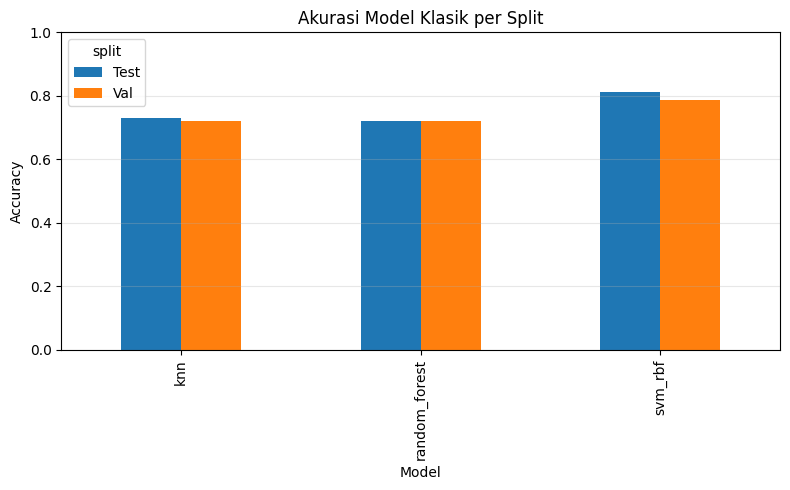

💾 Disimpan: artifacts/viz_metrics_classic/classic_models_accuracy_bar_20251203-045419.png


In [9]:
# %%
# ==========================================
# 27. Ringkasan Metrik Model Klasik (Val & Test)
#      + Bar Chart Akurasi
# ==========================================
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from datetime import datetime

models_loaded = {}
for name in ["svm_rbf", "random_forest", "knn"]:
    path = clf_dir / f"{name}.joblib"
    if path.exists():
        models_loaded[name] = joblib.load(path)
    else:
        print(f"⚠️ Model {name} belum ada di {path} (jalankan cell training dulu).")

rows = []
splits = {
    "Val":  (Xva_cl, Y_cl[val_idx_cl]),
    "Test": (Xte_cl, Y_cl[test_idx_cl]),
}

for mname, m in models_loaded.items():
    for split_name, (Xsplit, ysplit) in splits.items():
        yhat = m.predict(Xsplit)
        acc = accuracy_score(ysplit, yhat)
        prec, rec, f1, _ = precision_recall_fscore_support(
            ysplit, yhat, average="macro", zero_division=0
        )
        rows.append({
            "model": mname,
            "split": split_name,
            "accuracy": acc,
            "precision_macro": prec,
            "recall_macro": rec,
            "f1_macro": f1,
        })

metrics_df = pd.DataFrame(rows).sort_values(["split", "model"])
display(metrics_df)

VIZ_METRICS = ARTIFACTS / "viz_metrics_classic"
VIZ_METRICS.mkdir(parents=True, exist_ok=True)

ts = datetime.now().strftime("%Y%m%d-%H%M%S")
csv_path = VIZ_METRICS / f"classic_models_metrics_{ts}.csv"
metrics_df.to_csv(csv_path, index=False)
print("🗒️  Disimpan:", csv_path)

pivot = metrics_df.pivot(index="model", columns="split", values="accuracy")
ax = pivot.plot(kind="bar", figsize=(8, 5))
ax.set_ylim(0, 1.0)
ax.set_title("Akurasi Model Klasik per Split")
ax.set_ylabel("Accuracy")
ax.set_xlabel("Model")
ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
bar_path = VIZ_METRICS / f"classic_models_accuracy_bar_{ts}.png"
plt.savefig(bar_path, dpi=150, bbox_inches="tight")
plt.show()
print("💾 Disimpan:", bar_path)


🗒️  Saved per-sample predictions CSV: artifacts/viz_predictions_classic/test_predictions_classic_20251203-045444.csv


,path,true_id,true,svm_pred_id,svm_pred,svm_prob_max,rf_pred_id,rf_pred,rf_prob_max,knn_pred_id,knn_pred,knn_prob_max
0,/kaggle/input/covidqu/Infection Segmentation D...,0,COVID-19,0,COVID-19,0.422599,0,COVID-19,0.503333,0,COVID-19,0.4
1,/kaggle/input/covidqu/Infection Segmentation D...,0,COVID-19,0,COVID-19,0.840792,0,COVID-19,0.646667,0,COVID-19,0.6
2,/kaggle/input/covidqu/Infection Segmentation D...,0,COVID-19,0,COVID-19,0.978446,0,COVID-19,0.590000,0,COVID-19,1.0
3,/kaggle/input/covidqu/Infection Segmentation D...,0,COVID-19,1,Non-COVID,0.473410,0,COVID-19,0.426667,0,COVID-19,0.6
4,/kaggle/input/covidqu/Infection Segmentation D...,1,Non-COVID,1,Non-COVID,0.525499,0,COVID-19,0.640000,1,Non-COVID,0.6


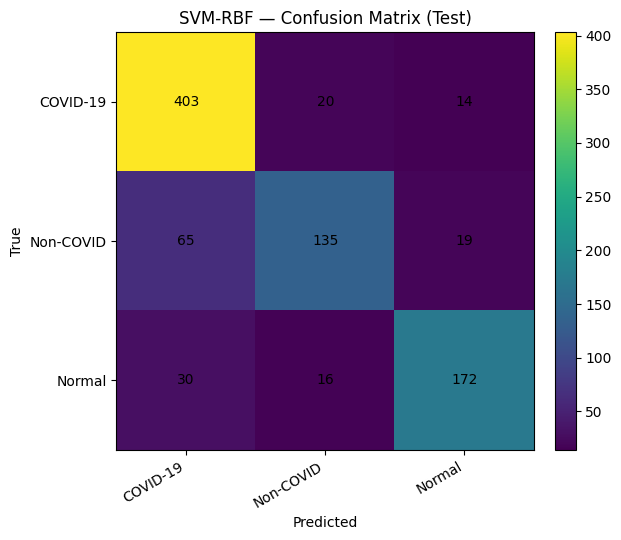

💾 Confusion matrix saved: artifacts/viz_predictions_classic/svm_confusion_matrix_test_20251203-045444.png


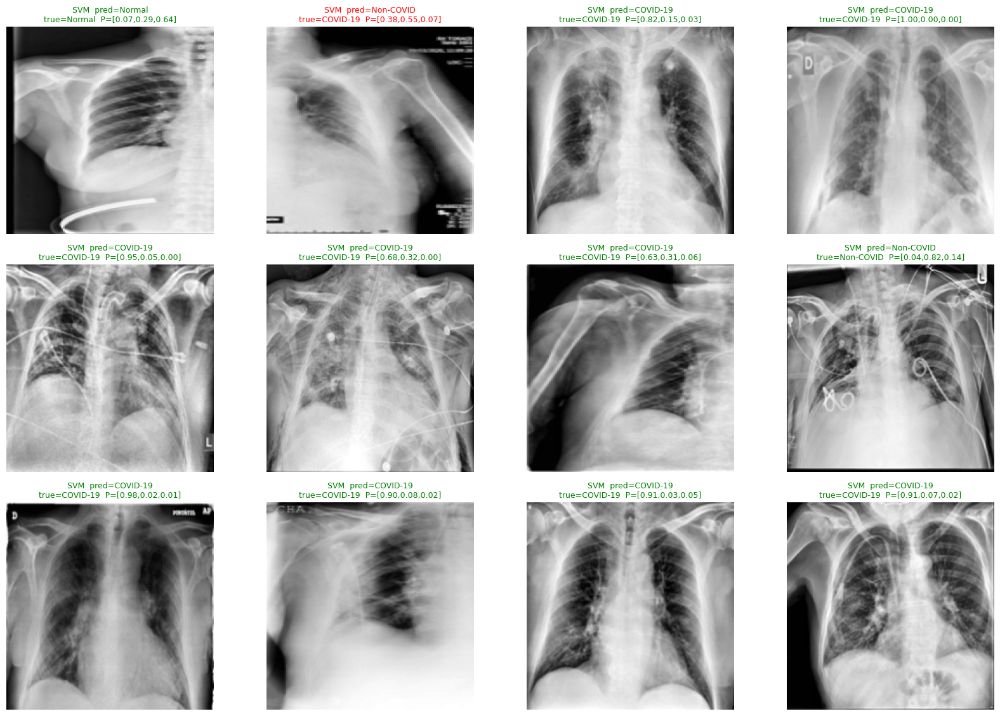

🖼️  Gallery saved: artifacts/viz_predictions_classic/gallery_svm_random_12_20251203-045444.png


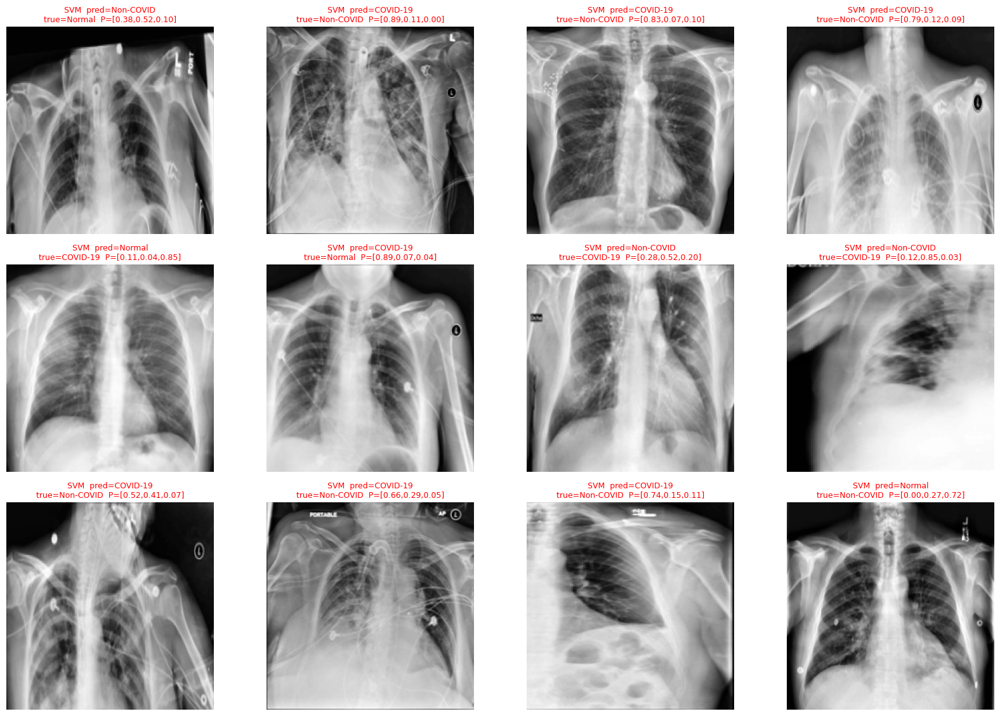

🖼️  Gallery saved: artifacts/viz_predictions_classic/gallery_svm_errors_12_20251203-045444.png


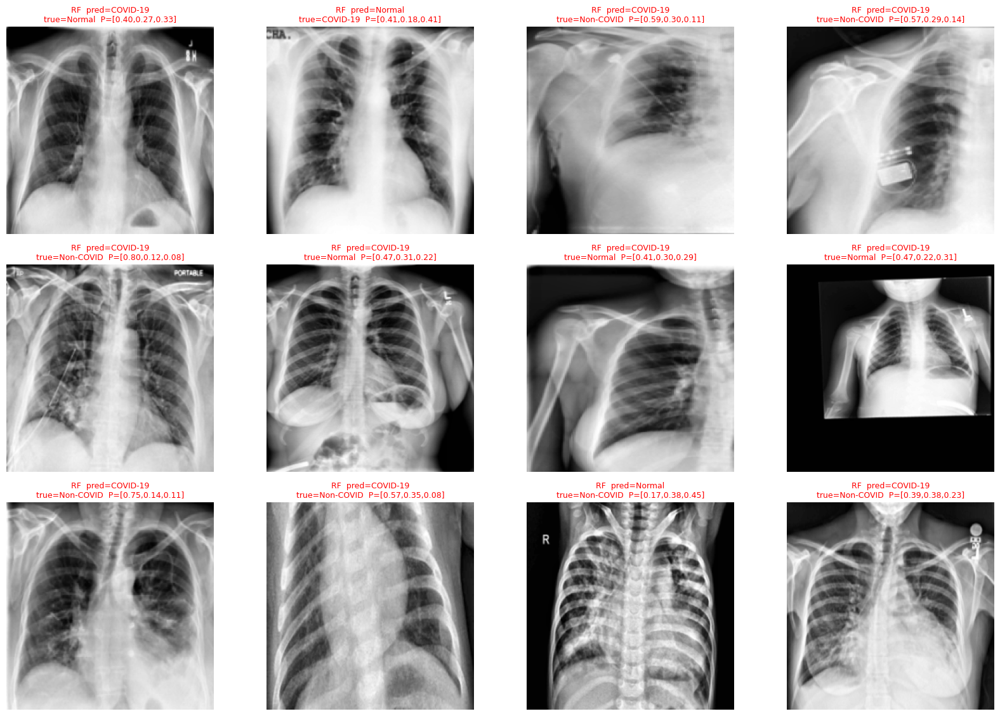

🖼️  Gallery saved: artifacts/viz_predictions_classic/gallery_rf_errors_12_20251203-045444.png


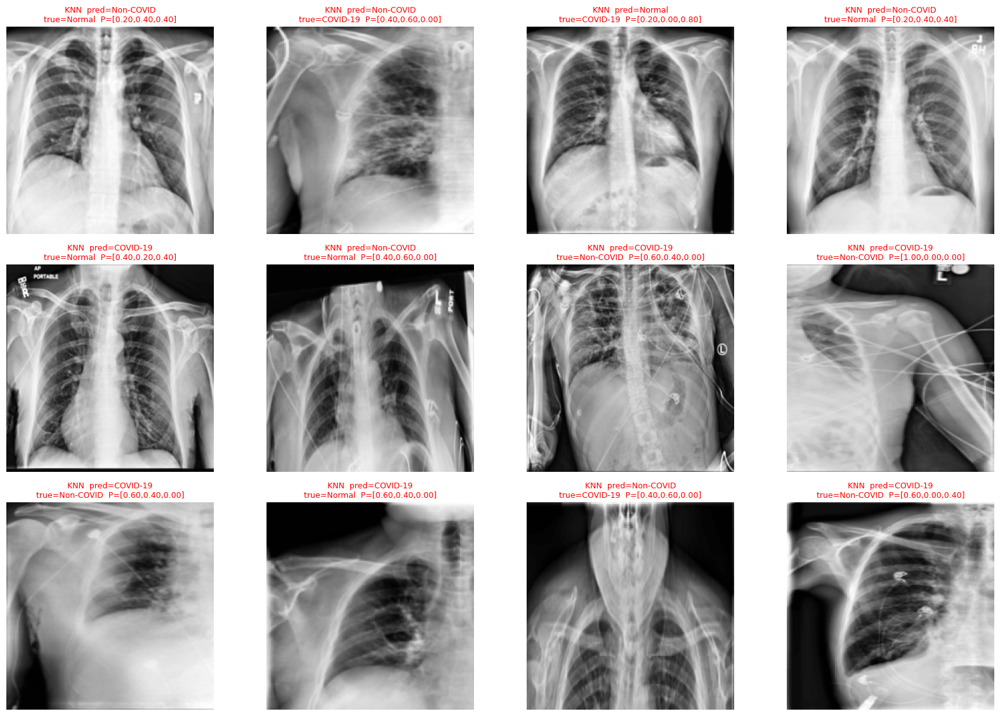

🖼️  Gallery saved: artifacts/viz_predictions_classic/gallery_knn_errors_12_20251203-045444.png


In [10]:
# %%
# ==========================================
# 28. Prediksi Test-Set per Sampel (SVM/RF/kNN)
#     + Galeri Visual (benar vs salah)
# ==========================================
from sklearn.metrics import confusion_matrix

VIZ_PRED = ARTIFACTS / "viz_predictions_classic"
VIZ_PRED.mkdir(parents=True, exist_ok=True)

# pakai X_cl & Y_cl dari pipeline klasik + index test_idx_cl
paths_all = paths_cl if paths_cl is not None else np.array([f"idx_{i}" for i in range(len(X_cl))])
paths_te  = paths_all[test_idx_cl]
X_te_img  = X_cl[test_idx_cl]     # untuk visualisasi
y_te      = Y_cl[test_idx_cl]

def _load_or_err(name):
    p = clf_dir / f"{name}.joblib"
    if not p.exists():
        raise RuntimeError(f"Model {name} belum ada di {p}. Jalankan cell training klasik terlebih dahulu.")
    return joblib.load(p)

svm = _load_or_err("svm_rbf")
rf  = _load_or_err("random_forest")
knn = _load_or_err("knn")

def safe_proba(model, X):
    if hasattr(model, "predict_proba"):
        return model.predict_proba(X)
    if hasattr(model, "decision_function"):
        z = model.decision_function(X)
        z = np.atleast_2d(z)
        z = z - z.max(axis=1, keepdims=True)
        expz = np.exp(z)
        prob = expz / expz.sum(axis=1, keepdims=True)
        if prob.shape[1] != len(CLASSES):
            prob = np.tile(np.array([1/len(CLASSES)]*len(CLASSES)), (len(X),1))
        return prob
    return np.tile(np.array([1/len(CLASSES)]*len(CLASSES)), (len(X),1))

y_pred_svm = svm.predict(Xte_cl)
proba_svm  = safe_proba(svm, Xte_cl)

y_pred_rf  = rf.predict(Xte_cl)
proba_rf   = safe_proba(rf, Xte_cl)

y_pred_knn = knn.predict(Xte_cl)
proba_knn  = safe_proba(knn, Xte_cl)

def id2name(arr):
    return np.vectorize(lambda k: CLASSES[int(k)])(arr)

df_pred = pd.DataFrame({
    "path": paths_te,
    "true_id": y_te,
    "true":   id2name(y_te),
    "svm_pred_id":  y_pred_svm,
    "svm_pred":     id2name(y_pred_svm),
    "svm_prob_max": proba_svm.max(axis=1),
    "rf_pred_id":   y_pred_rf,
    "rf_pred":      id2name(y_pred_rf),
    "rf_prob_max":  proba_rf.max(axis=1),
    "knn_pred_id":  y_pred_knn,
    "knn_pred":     id2name(y_pred_knn),
    "knn_prob_max": proba_knn.max(axis=1),
})

ts = datetime.now().strftime("%Y%m%d-%H%M%S")
csv_path = VIZ_PRED / f"test_predictions_classic_{ts}.csv"
df_pred.to_csv(csv_path, index=False)
print("🗒️  Saved per-sample predictions CSV:", csv_path)
display(df_pred.head())

# Confusion matrix SVM
cm = confusion_matrix(y_te, y_pred_svm, labels=list(CLASSES.keys()))
tick_labels = [CLASSES[i] for i in CLASSES.keys()]

plt.figure(figsize=(6.5, 5.5))
im = plt.imshow(cm, interpolation="nearest")
plt.title("SVM-RBF — Confusion Matrix (Test)")
plt.colorbar(im, fraction=0.046, pad=0.04)
plt.xticks(range(len(tick_labels)), tick_labels, rotation=30, ha="right")
plt.yticks(range(len(tick_labels)), tick_labels)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, str(cm[i, j]), ha="center", va="center", fontsize=10)
plt.xlabel("Predicted"); plt.ylabel("True")
plt.tight_layout()
cm_path = VIZ_PRED / f"svm_confusion_matrix_test_{ts}.png"
plt.savefig(cm_path, dpi=150, bbox_inches="tight")
plt.show()
print("💾 Confusion matrix saved:", cm_path)

# Galeri contoh
def plot_gallery(model_name="svm", n=12, errors_only=False, seed=42):
    rng = np.random.RandomState(seed)
    if model_name == "svm":
        pred_ids, probas = y_pred_svm, proba_svm
    elif model_name == "rf":
        pred_ids, probas = y_pred_rf, proba_rf
    else:
        pred_ids, probas = y_pred_knn, proba_knn

    correct = pred_ids == y_te
    idx_pool = np.where(~correct)[0] if errors_only else np.arange(len(y_te))
    if len(idx_pool) == 0:
        print("Semua prediksi benar untuk", model_name)
        return

    n_show = min(n, len(idx_pool))
    chosen = rng.choice(idx_pool, size=n_show, replace=False)

    rows = int(np.ceil(n_show / 4))
    cols = 4 if n_show >= 4 else n_show
    fig, axs = plt.subplots(rows, cols, figsize=(4.2*cols, 3.8*rows))
    axs = np.atleast_1d(axs).flatten()

    for ax, k in zip(axs, chosen):
        img = X_te_img[k]
        true_lbl = CLASSES[int(y_te[k])]
        pred_lbl = CLASSES[int(pred_ids[k])]
        pvec = probas[k]
        p_str = f"P=[{pvec[0]:.2f},{pvec[1]:.2f},{pvec[2]:.2f}]"

        ax.imshow(img, cmap="gray")
        ok = (pred_ids[k] == y_te[k])
        color = "green" if ok else "red"
        ax.set_title(
            f"{model_name.upper()}  pred={pred_lbl}\ntrue={true_lbl}  {p_str}",
            color=color,
            fontsize=9,
        )
        ax.axis("off")

    for ax in axs[n_show:]:
        ax.axis("off")

    plt.tight_layout()
    fig_path = VIZ_PRED / f"gallery_{model_name}_{'errors' if errors_only else 'random'}_{n_show}_{ts}.png"
    plt.savefig(fig_path, dpi=150, bbox_inches="tight")
    plt.show()
    print("🖼️  Gallery saved:", fig_path)

# Contoh panggilan:
plot_gallery("svm", n=12, errors_only=False, seed=7)
plot_gallery("svm", n=12, errors_only=True,  seed=7)
plot_gallery("rf",  n=12, errors_only=True,  seed=7)
plot_gallery("knn", n=12, errors_only=True,  seed=7)


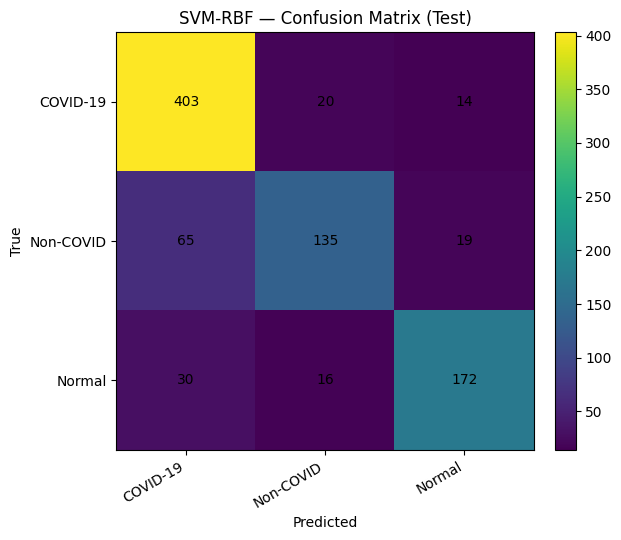

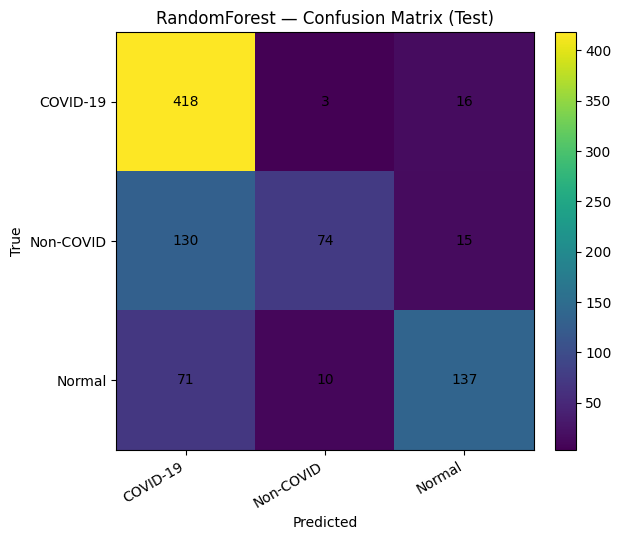

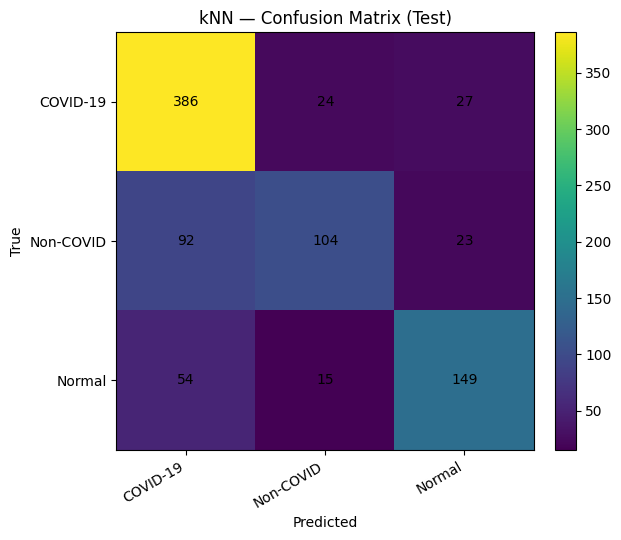

,model,accuracy,precision_macro,recall_macro,f1_macro
0,SVM-RBF,0.812357,0.812578,0.775875,0.789193
2,kNN,0.731121,0.733860,0.680556,0.695304
1,RandomForest,0.719680,0.780445,0.640954,0.661724


🗒️  Saved: artifacts/viz_stage4_classic/stage4_basic_stats_20251203-045456.csv


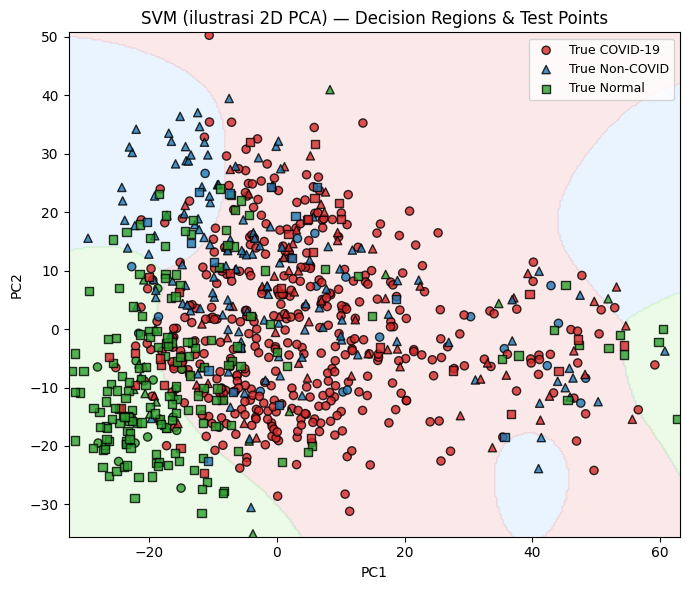

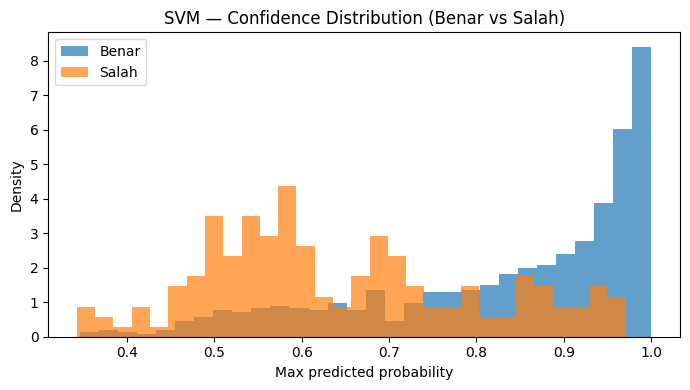

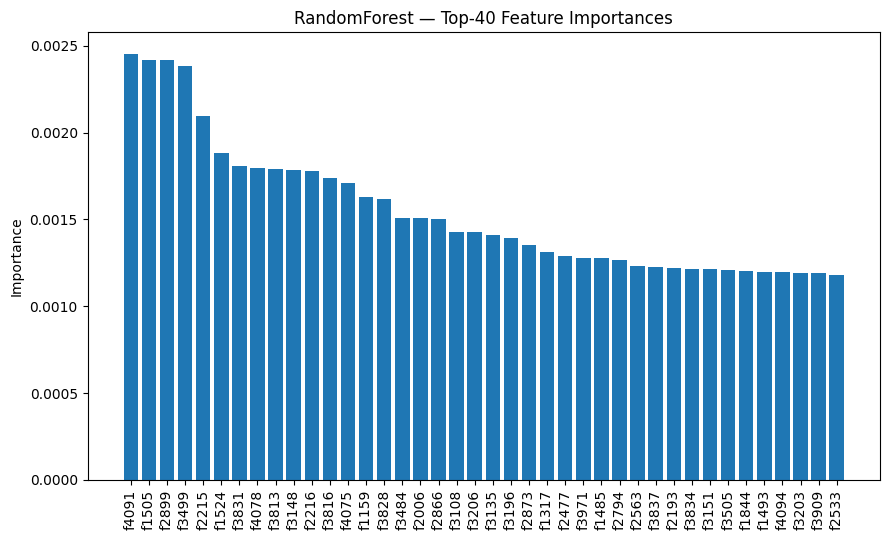

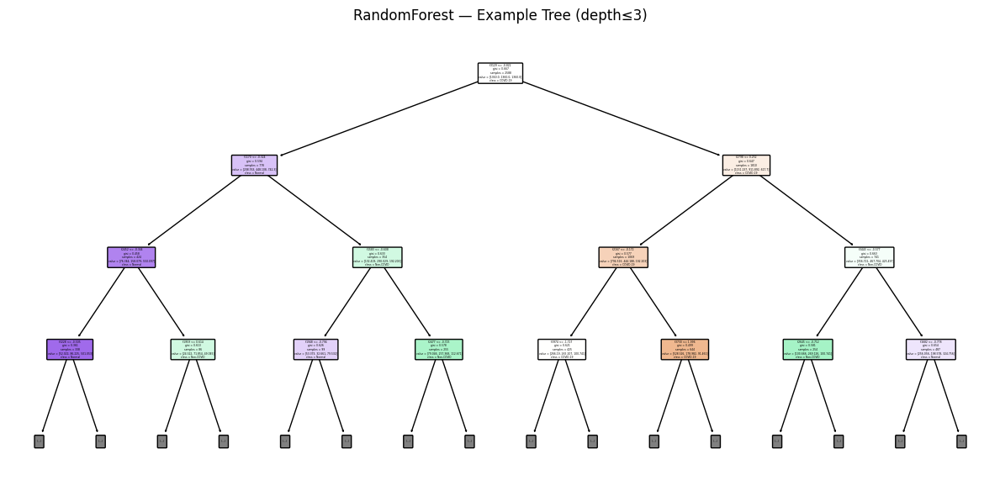

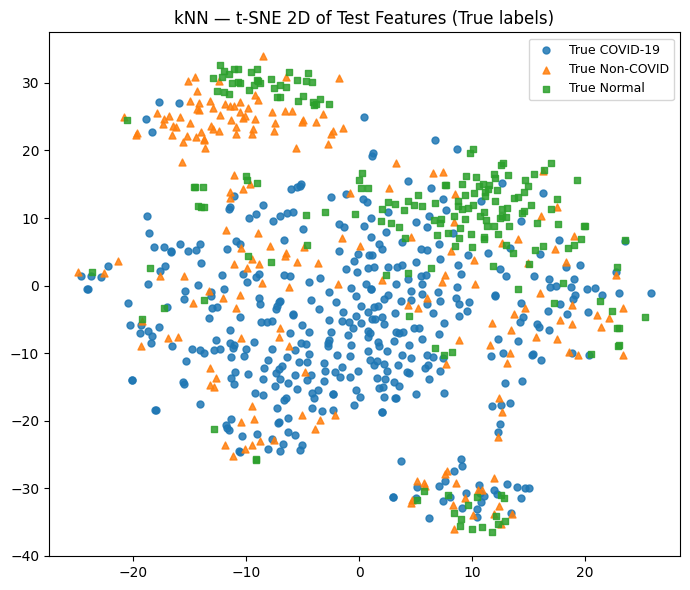

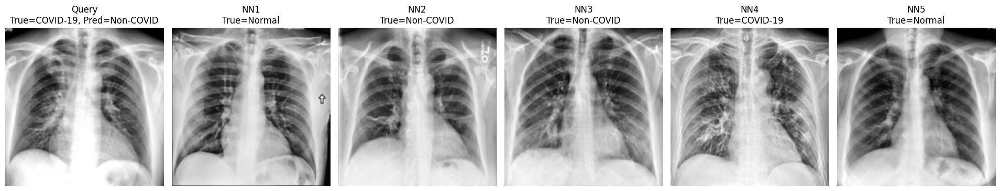

🖼️  Neighbor plot saved: artifacts/viz_stage4_classic/knn_query_9_neighbors_20251203-045456.png


In [11]:
# %%
# ==========================================
# 29. Tahap 4 — Analisis Kesalahan & Interpretasi
#     untuk SVM-RBF / RandomForest / kNN
# ==========================================
import json
from datetime import datetime
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    precision_recall_fscore_support,
    accuracy_score,
)
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.tree import plot_tree
from matplotlib.colors import ListedColormap
from sklearn.metrics.pairwise import pairwise_distances

VIZ_STAGE4 = ARTIFACTS / "viz_stage4_classic"
VIZ_STAGE4.mkdir(parents=True, exist_ok=True)

# Pastikan model & fitur sudah ada
svm = _load_or_err("svm_rbf")
rf  = _load_or_err("random_forest")
knn = _load_or_err("knn")

y_te = Y_cl[test_idx_cl]
paths_te = paths_all[test_idx_cl]

ts = datetime.now().strftime("%Y%m%d-%H%M%S")

# ---------- Langkah 1: Statistik dasar semua model ----------
def plot_cm(cm, title, savepath=None):
    plt.figure(figsize=(6.5,5.5))
    im = plt.imshow(cm, interpolation="nearest")
    plt.title(title)
    plt.colorbar(im, fraction=0.046, pad=0.04)
    tick_labels = [CLASSES[i] for i in CLASSES.keys()]
    plt.xticks(range(len(tick_labels)), tick_labels, rotation=30, ha="right")
    plt.yticks(range(len(tick_labels)), tick_labels)
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, str(cm[i, j]), ha="center", va="center", fontsize=10)
    plt.xlabel("Predicted"); plt.ylabel("True")
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=150, bbox_inches="tight")
    plt.show()

stats_rows = []
for name, clf in [("SVM-RBF", svm), ("RandomForest", rf), ("kNN", knn)]:
    yhat = clf.predict(Xte_cl)
    cm   = confusion_matrix(y_te, yhat, labels=list(CLASSES.keys()))
    report = classification_report(
        y_te, yhat,
        target_names=list(CLASSES.values()),
        output_dict=True,
        zero_division=0,
    )
    acc = accuracy_score(y_te, yhat)
    prec, rec, f1, _ = precision_recall_fscore_support(
        y_te, yhat, average="macro", zero_division=0
    )
    stats_rows.append({
        "model": name,
        "accuracy": acc,
        "precision_macro": prec,
        "recall_macro": rec,
        "f1_macro": f1,
    })

    plot_cm(cm, f"{name} — Confusion Matrix (Test)",
            VIZ_STAGE4 / f"cm_{name.replace('-','').lower()}_{ts}.png")
    with open(VIZ_STAGE4 / f"classification_report_{name.replace('-','').lower()}_{ts}.json","w") as f:
        json.dump(report, f, indent=2)

df_stats = pd.DataFrame(stats_rows).sort_values("f1_macro", ascending=False)
display(df_stats)
df_stats.to_csv(VIZ_STAGE4 / f"stage4_basic_stats_{ts}.csv", index=False)
print("🗒️  Saved:", VIZ_STAGE4 / f"stage4_basic_stats_{ts}.csv")

# ---------- Langkah 2A: SVM — PCA 2D + decision boundary + confidence histogram ----------
pca = PCA(n_components=2, random_state=42)
Z_te_2d = pca.fit_transform(Xte_cl)

svm_2d = SVC(kernel="rbf", C=10, gamma="scale", probability=True, random_state=42)
svm_2d.fit(Z_te_2d, y_te)

x_min, x_max = Z_te_2d[:,0].min()-0.5, Z_te_2d[:,0].max()+0.5
y_min, y_max = Z_te_2d[:,1].min()-0.5, Z_te_2d[:,1].max()+0.5
xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 300),
    np.linspace(y_min, y_max, 300)
)
ZZ = svm_2d.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

cmap_bg = ListedColormap(["#f7cac9","#cce5ff","#d1f7c4"])
plt.figure(figsize=(7,6))
plt.contourf(xx, yy, ZZ, alpha=0.4, cmap=cmap_bg)

yhat_svm_full = svm.predict(Xte_cl)
for cls, marker in zip(list(CLASSES.keys()), ["o","^","s"]):
    idx = (y_te == cls)
    plt.scatter(
        Z_te_2d[idx,0],
        Z_te_2d[idx,1],
        c=yhat_svm_full[idx],
        cmap=ListedColormap(["#d62728","#1f77b4","#2ca02c"]),
        marker=marker,
        edgecolor="k",
        s=35,
        alpha=0.8,
        label=f"True {CLASSES[cls]}",
    )
plt.title("SVM (ilustrasi 2D PCA) — Decision Regions & Test Points")
plt.xlabel("PC1"); plt.ylabel("PC2")
plt.legend(loc="best", fontsize=9)
plt.tight_layout()
plt.savefig(VIZ_STAGE4 / f"svm_pca2d_boundary_{ts}.png", dpi=150, bbox_inches="tight")
plt.show()

proba_svm_full = safe_proba(svm, Xte_cl)
maxp = proba_svm_full.max(axis=1)
correct_mask = (yhat_svm_full == y_te)

plt.figure(figsize=(7,4))
plt.hist(maxp[correct_mask], bins=30, alpha=0.7, label="Benar", density=True)
plt.hist(maxp[~correct_mask], bins=30, alpha=0.7, label="Salah", density=True)
plt.xlabel("Max predicted probability"); plt.ylabel("Density")
plt.title("SVM — Confidence Distribution (Benar vs Salah)")
plt.legend()
plt.tight_layout()
plt.savefig(VIZ_STAGE4 / f"svm_confidence_hist_{ts}.png", dpi=150, bbox_inches="tight")
plt.show()

# ---------- Langkah 2B: Random Forest — Feature Importances & Tree Dangkal ----------
importances = rf.feature_importances_
N = min(40, importances.shape[0])
top_idx = np.argsort(importances)[::-1][:N]
top_vals = importances[top_idx]

plt.figure(figsize=(9,5.5))
plt.bar(range(N), top_vals)
plt.xticks(range(N), [f"f{int(i)}" for i in top_idx], rotation=90)
plt.ylabel("Importance")
plt.title(f"RandomForest — Top-{N} Feature Importances")
plt.tight_layout()
plt.savefig(VIZ_STAGE4 / f"rf_feature_importances_top{N}_{ts}.png", dpi=150, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12,6))
plot_tree(
    rf.estimators_[0],
    max_depth=3,
    filled=True,
    feature_names=[f"f{i}" for i in range(importances.shape[0])],
    class_names=[CLASSES[i] for i in CLASSES.keys()],
    rounded=True,
)
plt.title("RandomForest — Example Tree (depth≤3)")
plt.tight_layout()
plt.savefig(VIZ_STAGE4 / f"rf_tree_depth3_{ts}.png", dpi=150, bbox_inches="tight")
plt.show()

# ---------- Langkah 2C: kNN — t-SNE & Neighbor Inspection ----------
n_tsne = min(800, Xte_cl.shape[0])
rng = np.random.RandomState(42)
sel = np.sort(rng.choice(np.arange(Xte_cl.shape[0]), size=n_tsne, replace=False))

tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate="auto",
    init="pca",
    random_state=42,
)
Z_tsne = tsne.fit_transform(Xte_cl[sel])

yhat_knn_full = knn.predict(Xte_cl)
plt.figure(figsize=(7,6))
for cls, marker in zip(list(CLASSES.keys()), ["o","^","s"]):
    idx = (y_te[sel] == cls)
    plt.scatter(
        Z_tsne[idx,0],
        Z_tsne[idx,1],
        marker=marker,
        s=25,
        alpha=0.85,
        label=f"True {CLASSES[cls]}",
    )
plt.title("kNN — t-SNE 2D of Test Features (True labels)")
plt.legend(fontsize=9)
plt.tight_layout()
plt.savefig(VIZ_STAGE4 / f"knn_tsne_true_{ts}.png", dpi=150, bbox_inches="tight")
plt.show()

def show_query_neighbors_kNN(qk, n_neighbors=5):
    """
    qk: index ke dalam Xte_cl (0..len(test)-1)
    Menampilkan query (test) + 5 tetangga terdekat di TRAIN.
    """
    D = pairwise_distances(Xte_cl[qk][None, :], Xtr_cl, metric="euclidean").ravel()
    nn_idx_rel = np.argsort(D)[:n_neighbors]   # index relatif di train_idx_cl
    nn_global  = train_idx_cl[nn_idx_rel]

    ncols = n_neighbors + 1
    plt.figure(figsize=(3.2*ncols, 3.6))

    # Query
    plt.subplot(1, ncols, 1)
    plt.imshow(X_cl[test_idx_cl[qk]], cmap="gray")
    plt.title(f"Query\nTrue={CLASSES[int(y_te[qk])]}, Pred={CLASSES[int(yhat_knn_full[qk])]}")
    plt.axis("off")

    # Neighbors
    for j, ridx in enumerate(nn_global, start=2):
        plt.subplot(1, ncols, j)
        plt.imshow(X_cl[ridx], cmap="gray")
        plt.title(f"NN{j-1}\nTrue={CLASSES[int(Y_cl[ridx])]}")
        plt.axis("off")

    plt.tight_layout()
    out_path = VIZ_STAGE4 / f"knn_query_{qk}_neighbors_{ts}.png"
    plt.savefig(out_path, dpi=150, bbox_inches="tight")
    plt.show()
    print("🖼️  Neighbor plot saved:", out_path)

# Contoh: inspect satu sampel yang salah prediksi oleh kNN (kalau ada)
wrong_idx = np.where(yhat_knn_full != y_te)[0]
if len(wrong_idx) > 0:
    show_query_neighbors_kNN(int(wrong_idx[0]), n_neighbors=5)
else:
    print("Tidak ada salah prediksi pada kNN di test set.")


In [12]:
# %%
# ==========================================
# 4. DATA AUGMENTATION (GLOBAL, DIPAKAI UNTUK
#    SEMUA MODEL KECUALI BASELINE NO-AUG)
# ==========================================
data_augmentation = tf.keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.05),
        layers.RandomZoom(0.05),
    ],
    name="data_augmentation",
)
print("✅ Data augmentation pipeline siap digunakan.")

✅ Data augmentation pipeline siap digunakan.


I0000 00:00:1764737744.410616      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


In [13]:
# %%
# ==========================================
# 5. TF DATASET PIPELINE
# ==========================================
def make_tf_ds_gray(X, y, batch_size=32, shuffle=False):
    X_1ch = X[..., np.newaxis]      # (N, 224, 224, 1)
    ds = tf.data.Dataset.from_tensor_slices((X_1ch, y))
    if shuffle:
        ds = ds.shuffle(len(y), reshuffle_each_iteration=True)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

def make_tf_ds_rgb(X, y, batch_size=32, shuffle=False):
    X_3ch = np.repeat(X[..., np.newaxis], 3, axis=-1)   # (N, 224, 224, 3)
    ds = tf.data.Dataset.from_tensor_slices((X_3ch, y))
    if shuffle:
        ds = ds.shuffle(len(y), reshuffle_each_iteration=True)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

train_ds_gray = make_tf_ds_gray(X[train_idx], Y[train_idx], shuffle=True)
val_ds_gray   = make_tf_ds_gray(X[val_idx],   Y[val_idx],   shuffle=False)
test_ds_gray  = make_tf_ds_gray(X[test_idx],  Y[test_idx],  shuffle=False)

train_ds_rgb = make_tf_ds_rgb(X[train_idx], Y[train_idx], shuffle=True)
val_ds_rgb   = make_tf_ds_rgb(X[val_idx],   Y[val_idx],   shuffle=False)
test_ds_rgb  = make_tf_ds_rgb(X[test_idx],  Y[test_idx],  shuffle=False)

print("✅ TF Dataset siap (gray & RGB).")

✅ TF Dataset siap (gray & RGB).


In [14]:
# %%
# ==========================================
# 6. LAYER LORA DENSE (UMUM UNTUK HEAD)
# ==========================================
class LoRADense(layers.Layer):
    """
    Layer Dense kustom dengan Low-Rank Adaptation (LoRA).
    Memecah bobot W menjadi W_frozen + (A @ B).
    Hanya matriks A dan B (rank kecil) yang dilatih.
    """
    def __init__(self, units, rank=8, activation=None, **kwargs):
        super().__init__(**kwargs)
        self.units = units
        self.rank = rank
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        dim = input_shape[-1]
        self.kernel_frozen = self.add_weight(
            name="kernel_frozen",
            shape=(dim, self.units),
            initializer="glorot_uniform",
            trainable=False
        )
        self.lora_A = self.add_weight(
            name="lora_A",
            shape=(dim, self.rank),
            initializer="he_uniform",
            trainable=True
        )
        self.lora_B = self.add_weight(
            name="lora_B",
            shape=(self.rank, self.units),
            initializer="zeros",
            trainable=True
        )
        self.bias = self.add_weight(
            name="bias",
            shape=(self.units,),
            initializer="zeros",
            trainable=True
        )

    def call(self, inputs):
        frozen_out = tf.matmul(inputs, self.kernel_frozen)
        lora_out = tf.matmul(tf.matmul(inputs, self.lora_A), self.lora_B)
        output = frozen_out + lora_out + self.bias
        if self.activation:
            output = self.activation(output)
        return output
    
    def get_config(self):
        config = super().get_config()
        config.update({"units": self.units, "rank": self.rank})
        return config

In [15]:
# %%
# ==========================================
# 7. HELPER: EVALUASI MODEL KERAS
# ==========================================
def evaluate_keras_model(model, test_ds, test_idx, prefix, title_prefix):
    print(f"\n--- Evaluasi {title_prefix} pada Test Set ---")
    
    y_probs = model.predict(test_ds, verbose=1)
    y_pred = np.argmax(y_probs, axis=1)
    y_true = Y[test_idx]
    confidence_scores = np.max(y_probs, axis=1)
    
    test_paths = meta.iloc[test_idx]['image_path'].values
    
    df_results = pd.DataFrame({
        'File Path': test_paths,
        'True Label': [CLASSES[i] for i in y_true],
        'Predicted Label': [CLASSES[i] for i in y_pred],
        'Confidence': confidence_scores,
        'Prob (COVID-19)': y_probs[:, 0],
        'Prob (Non-COVID)': y_probs[:, 1],
        'Prob (Normal)': y_probs[:, 2],
        'Status': ['CORRECT' if t == p else 'WRONG'
                   for t, p in zip(y_true, y_pred)]
    })
    
    acc = np.mean(y_true == y_pred)
    print(f"\n📊 Test Accuracy ({prefix}): {acc:.2%}")
    
    print("\n=== Contoh Hasil Prediksi (10 Sampel Acak) ===")
    display(df_results.sample(10))
    
    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    print("\nConfusion Matrix:")
    print(cm)
    
    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=list(CLASSES.values()),
        yticklabels=list(CLASSES.values())
    )
    plt.title(f'Confusion Matrix - {title_prefix}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.show()
    
    # Classification report
    report_dict = classification_report(
        y_true,
        y_pred,
        target_names=list(CLASSES.values()),
        output_dict=True
    )
    df_report = pd.DataFrame(report_dict).transpose()
    print("\n📋 Classification Report:")
    display(df_report.style.format("{:.4f}"))
    
    csv_path = ARTIFACTS / f"classification_report_{prefix}.csv"
    df_report.to_csv(csv_path)
    print(f"\n💾 Laporan tersimpan di: {csv_path}")
    
    # Visualisasi 5 benar & 5 salah
    def _plot_samples(df_subset, title, color_text, row_idx, total_rows=2):
        n_samples = min(5, len(df_subset))
        if n_samples == 0:
            print(f"⚠️ Tidak ada sampel untuk kategori: {title}")
            return
        samples = df_subset.sample(n=n_samples, random_state=42)
        for i, (_, row) in enumerate(samples.iterrows()):
            plt.subplot(total_rows, 5, (row_idx * 5) + (i + 1))
            img = cv2.imread(row['File Path'], cv2.IMREAD_GRAYSCALE)
            img = cv2.resize(img, TARGET_SIZE)
            plt.imshow(img, cmap='gray')
            plt.axis('off')
            info_text = (f"T: {row['True Label']}\n"
                         f"P: {row['Predicted Label']}\n"
                         f"Conf: {row['Confidence']:.1%}")
            plt.title(info_text, color=color_text, fontsize=9, weight='bold')
    
    plt.figure(figsize=(15, 7))
    correct_df = df_results[df_results['Status'] == 'CORRECT']
    wrong_df   = df_results[df_results['Status'] == 'WRONG']
    _plot_samples(correct_df, "Prediksi Benar", 'green', row_idx=0)
    _plot_samples(wrong_df,   "Prediksi Salah", 'red',   row_idx=1)
    plt.suptitle(f"{title_prefix}: 5 Prediksi Benar (Atas) vs 5 Prediksi Salah (Bawah)", fontsize=16)
    plt.tight_layout()
    plt.show()
    
    return df_results, df_report

In [16]:
# %%
# ==========================================
# 8. MODEL 1A: CUSTOM CNN + LoRA (NO AUGMENTATION)
# ==========================================
def build_custom_lora_cnn_noaug(input_shape=(224, 224, 1), num_classes=3, rank=16):
    inputs = layers.Input(shape=input_shape)
    x = inputs  # TANPA data_augmentation
    
    # Block 1
    x = layers.Conv2D(32, (3, 3), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)  # 112x112
    
    # Block 2
    x = layers.Conv2D(64, (3, 3), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)  # 56x56
    
    # Block 3
    x = layers.Conv2D(128, (3, 3), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)  # 28x28
    
    # Block 4
    x = layers.Conv2D(256, (3, 3), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)  # 14x14
    
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.4)(x)
    
    x = LoRADense(units=256, rank=rank, activation='relu', name='cnn_noaug_lora_dense')(x)
    x = layers.Dropout(0.4)(x)
    
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    
    model = models.Model(inputs, outputs, name="Custom_CNN_LoRA_NoAug")
    return model

cnn_noaug_model = build_custom_lora_cnn_noaug(rank=32)
cnn_noaug_model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)
cnn_noaug_model.summary()

Model: "Custom_CNN_LoRA_NoAug"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       294,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ cnn_noaug_lora_dense            │ (None, 256)            │        82,176 │
│ (LoRADense)                     │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 3)              │           77

 Total params: 472,227 (1.80 MB)

 Trainable params: 405,731 (1.55 MB)

 Non-trainable params: 66,496 (259.75 KB)

In [17]:
# %%
# 9. TRAINING MODEL 1A: CUSTOM CNN + LoRA (NO AUG)
checkpoint_path_cnn_noaug = ARTIFACTS / "best_custom_lora_noaug.h5"
history_path_cnn_noaug    = ARTIFACTS / "history_custom_lora_noaug.pkl"

if checkpoint_path_cnn_noaug.exists() and history_path_cnn_noaug.exists():
    print("🔁 Menemukan checkpoint & history untuk Custom CNN + LoRA (NO AUG).")
    print("   Skip training, load history dari disk saja.")
    
    # load history supaya cell plotting tetap bisa jalan
    with open(history_path_cnn_noaug, "rb") as f:
        hist_dict = pickle.load(f)
    
    history_cnn_noaug = type("History", (), {})()
    history_cnn_noaug.history = hist_dict
else:
    print("🚀 Training Custom CNN + LoRA (NO AUG) dari awal...")

    history_cnn_noaug = cnn_noaug_model.fit(
        train_ds_gray,
        validation_data=val_ds_gray,
        epochs=25,  # bisa 25 dulu utk baseline no-aug
        class_weight=CLASS_WEIGHTS,
        callbacks=[
            callbacks.ModelCheckpoint(
                checkpoint_path_cnn_noaug,
                save_best_only=True,
                monitor='val_loss',
                verbose=1
            ),
            callbacks.EarlyStopping(
                monitor='val_loss',
                patience=6,
                restore_best_weights=True,
                verbose=1
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=3,
                verbose=1
            )
        ]
    )

    with open(history_path_cnn_noaug, "wb") as f:
        pickle.dump(history_cnn_noaug.history, f)
    print("💾 History Custom CNN + LoRA (NO AUG) disimpan ke:", history_path_cnn_noaug)


🔁 Menemukan checkpoint & history untuk Custom CNN + LoRA (NO AUG).
   Skip training, load history dari disk saja.



--- Evaluasi Custom CNN + LoRA (NO AUGMENTATION) pada Test Set ---


I0000 00:00:1764737759.535593     189 service.cc:148] XLA service 0x79ef900444a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764737759.536249     189 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1764737759.642018     189 cuda_dnn.cc:529] Loaded cuDNN version 90300


21/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step

I0000 00:00:1764737761.353422     189 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

📊 Test Accuracy (custom_lora_noaug): 71.74%

=== Contoh Hasil Prediksi (10 Sampel Acak) ===


,File Path,True Label,Predicted Label,Confidence,Prob (COVID-19),Prob (Non-COVID),Prob (Normal),Status
796,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.942111,0.942111,0.032339,0.025550,CORRECT
319,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.885994,0.885994,0.065453,0.048553,CORRECT
382,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,Normal,0.733615,0.092634,0.173751,0.733615,WRONG
728,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.979244,0.979244,0.010375,0.010381,CORRECT
422,/kaggle/input/covidqu/Infection Segmentation D...,Normal,Normal,0.588648,0.171948,0.239404,0.588648,CORRECT
327,/kaggle/input/covidqu/Infection Segmentation D...,Non-COVID,Normal,0.843977,0.030739,0.125284,0.843977,WRONG
848,/kaggle/input/covidqu/Infection Segmentation D...,Normal,Normal,0.909775,0.012315,0.077910,0.909775,CORRECT
136,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.494840,0.494840,0.321359,0.183801,CORRECT
670,/kaggle/input/covidqu/Infection Segmentation D...,Normal,Normal,0.541235,0.270506,0.188259,0.541235,CORRECT
778,/kaggle/input/covidqu/Infection Segmentation D...,Normal,Normal,0.863507,0.027739,0.108755,0.863507,CORRECT



Confusion Matrix:
[[380  12  45]
 [ 64  79  76]
 [ 30  20 168]]


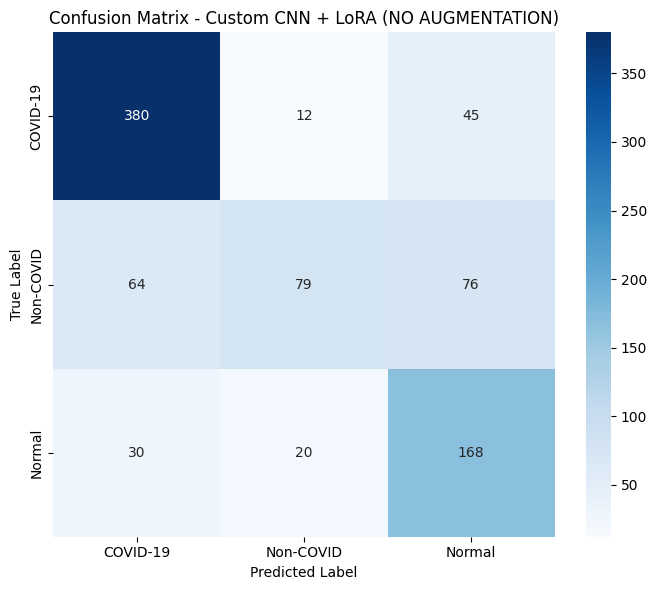


📋 Classification Report:


,precision,recall,f1-score,support
COVID-19,0.8017,0.8696,0.8342,437.0000
Non-COVID,0.7117,0.3607,0.4788,219.0000
Normal,0.5813,0.7706,0.6627,218.0000
accuracy,0.7174,0.7174,0.7174,0.7174
macro avg,0.6982,0.6670,0.6586,874.0000
weighted avg,0.7242,0.7174,0.7024,874.0000



💾 Laporan tersimpan di: artifacts/classification_report_custom_lora_noaug.csv


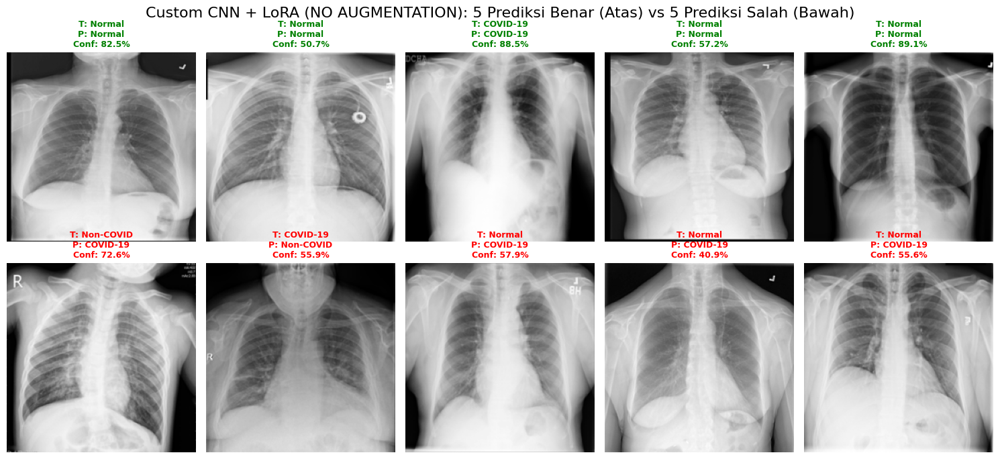

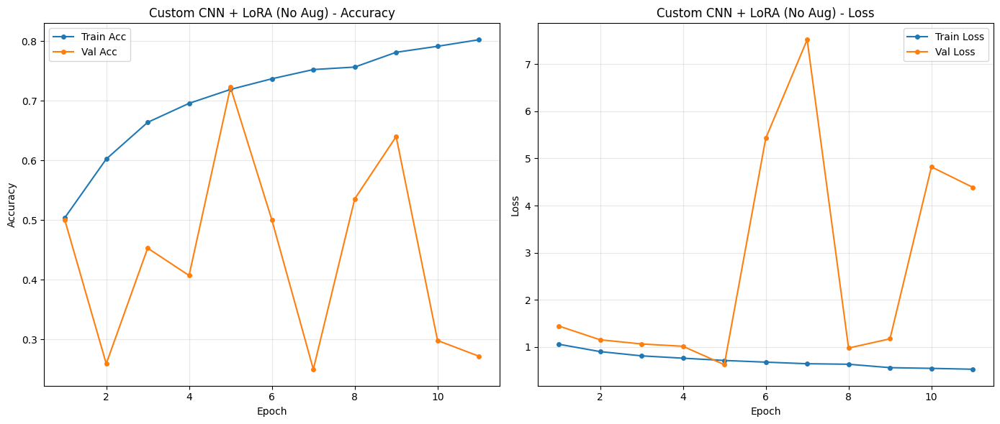

In [18]:
# %%
# 10. EVALUASI & KURVA TRAINING MODEL 1A (NO AUG)
if checkpoint_path_cnn_noaug.exists():
    cnn_noaug_model.load_weights(checkpoint_path_cnn_noaug)

df_cnn_noaug_results, df_cnn_noaug_report = evaluate_keras_model(
    cnn_noaug_model,
    test_ds_gray,
    test_idx,
    prefix="custom_lora_noaug",
    title_prefix="Custom CNN + LoRA (NO AUGMENTATION)"
)

# Plot kurva training
hist = history_cnn_noaug.history
epochs_range = range(1, len(hist['accuracy']) + 1)
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, hist['accuracy'], label='Train Acc', marker='o', markersize=4)
plt.plot(epochs_range, hist['val_accuracy'], label='Val Acc', marker='o', markersize=4)
plt.title('Custom CNN + LoRA (No Aug) - Accuracy')
plt.xlabel('Epoch'); plt.ylabel('Accuracy')
plt.legend(); plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(epochs_range, hist['loss'], label='Train Loss', marker='o', markersize=4)
plt.plot(epochs_range, hist['val_loss'], label='Val Loss', marker='o', markersize=4)
plt.title('Custom CNN + LoRA (No Aug) - Loss')
plt.xlabel('Epoch'); plt.ylabel('Loss')
plt.legend(); plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [19]:
# %%
# ==========================================
# 11. MODEL 1B: CUSTOM CNN + LoRA (WITH AUGMENTATION)
# ==========================================
def build_custom_lora_cnn_aug(input_shape=(224, 224, 1), num_classes=3, rank=16):
    inputs = layers.Input(shape=input_shape)
    
    # PAKAI data_augmentation
    x = data_augmentation(inputs)
    
    # Block 1
    x = layers.Conv2D(32, (3, 3), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    
    # Block 2
    x = layers.Conv2D(64, (3, 3), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    
    # Block 3
    x = layers.Conv2D(128, (3, 3), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    
    # Block 4
    x = layers.Conv2D(256, (3, 3), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.4)(x)
    
    x = LoRADense(units=256, rank=rank, activation='relu', name='cnn_aug_lora_dense')(x)
    x = layers.Dropout(0.4)(x)
    
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    
    model = models.Model(inputs, outputs, name="Custom_CNN_LoRA_Aug")
    return model

cnn_aug_model = build_custom_lora_cnn_aug(rank=32)
cnn_aug_model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)
cnn_aug_model.summary()

Model: "Custom_CNN_LoRA_Aug"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 224, 224, 32)   │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 112, 112, 64)   │        18,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 56, 56, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_6 (Activation)       │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 28, 28, 256)    │       294,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_7 (Activation)       │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ cnn_aug_lora_dense (LoRADense)  │ (None, 256)            │        82,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 472,227 (1.80 MB)

 Trainable params: 405,731 (1.55 MB)

 Non-trainable params: 66,496 (259.75 KB)

In [20]:
# %%
# 12. TRAINING MODEL 1B: CUSTOM CNN + LoRA + AUGMENTATION
checkpoint_path_cnn_aug = ARTIFACTS / "best_custom_lora_aug.h5"
history_path_cnn_aug    = ARTIFACTS / "history_custom_lora_aug.pkl"

if checkpoint_path_cnn_aug.exists() and history_path_cnn_aug.exists():
    print("🔁 Menemukan checkpoint & history untuk Custom CNN + LoRA (+AUG).")
    print("   Skip training, load history dari disk saja.")
    
    with open(history_path_cnn_aug, "rb") as f:
        hist_dict = pickle.load(f)
    
    history_cnn_aug = type("History", (), {})()
    history_cnn_aug.history = hist_dict
else:
    print("🚀 Training Custom CNN + LoRA (+AUG) dari awal...")

    history_cnn_aug = cnn_aug_model.fit(
        train_ds_gray,
        validation_data=val_ds_gray,
        epochs=30,
        class_weight=CLASS_WEIGHTS,
        callbacks=[
            callbacks.ModelCheckpoint(
                checkpoint_path_cnn_aug,
                save_best_only=True,
                monitor='val_loss',
                verbose=1
            ),
            callbacks.EarlyStopping(
                monitor='val_loss',
                patience=8,
                restore_best_weights=True,
                verbose=1
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=4,
                verbose=1
            )
        ]
    )

    with open(history_path_cnn_aug, "wb") as f:
        pickle.dump(history_cnn_aug.history, f)
    print("💾 History Custom CNN + LoRA (+AUG) disimpan ke:", history_path_cnn_aug)


🔁 Menemukan checkpoint & history untuk Custom CNN + LoRA (+AUG).
   Skip training, load history dari disk saja.



--- Evaluasi Custom CNN + LoRA (WITH AUGMENTATION) pada Test Set ---
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step

📊 Test Accuracy (custom_lora_aug): 81.35%

=== Contoh Hasil Prediksi (10 Sampel Acak) ===


,File Path,True Label,Predicted Label,Confidence,Prob (COVID-19),Prob (Non-COVID),Prob (Normal),Status
660,/kaggle/input/covidqu/Infection Segmentation D...,Non-COVID,Normal,0.689424,0.097096,0.213480,0.689424,WRONG
204,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.828958,0.828958,0.091322,0.079721,CORRECT
861,/kaggle/input/covidqu/Infection Segmentation D...,Normal,Normal,0.850229,0.033068,0.116704,0.850229,CORRECT
111,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,Non-COVID,0.368352,0.264013,0.368352,0.367635,WRONG
332,/kaggle/input/covidqu/Infection Segmentation D...,Non-COVID,Non-COVID,0.988709,0.009683,0.988709,0.001608,CORRECT
852,/kaggle/input/covidqu/Infection Segmentation D...,Non-COVID,Normal,0.732474,0.007725,0.259801,0.732474,WRONG
455,/kaggle/input/covidqu/Infection Segmentation D...,Normal,Normal,0.619059,0.108298,0.272643,0.619059,CORRECT
109,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.772603,0.772603,0.211574,0.015823,CORRECT
135,/kaggle/input/covidqu/Infection Segmentation D...,Normal,Normal,0.994128,0.000102,0.005769,0.994128,CORRECT
586,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.998332,0.998332,0.000908,0.000759,CORRECT



Confusion Matrix:
[[405  25   7]
 [ 51 135  33]
 [ 17  30 171]]


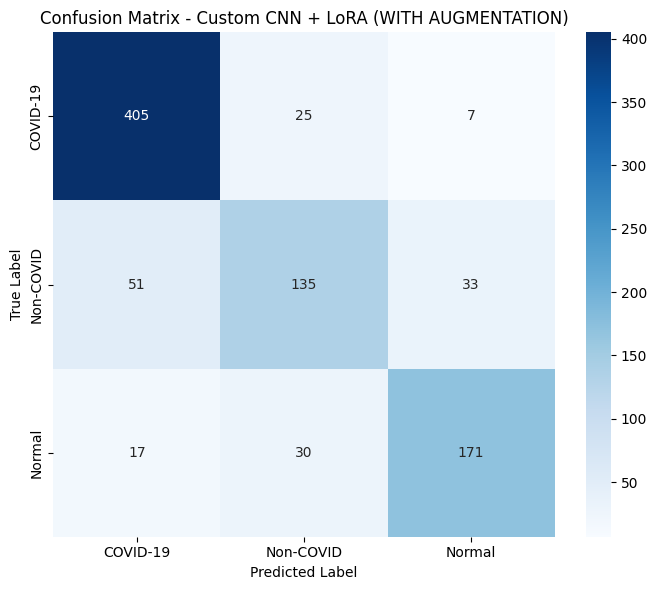


📋 Classification Report:


,precision,recall,f1-score,support
COVID-19,0.8562,0.9268,0.8901,437.0000
Non-COVID,0.7105,0.6164,0.6601,219.0000
Normal,0.8104,0.7844,0.7972,218.0000
accuracy,0.8135,0.8135,0.8135,0.8135
macro avg,0.7924,0.7759,0.7825,874.0000
weighted avg,0.8083,0.8135,0.8093,874.0000



💾 Laporan tersimpan di: artifacts/classification_report_custom_lora_aug.csv


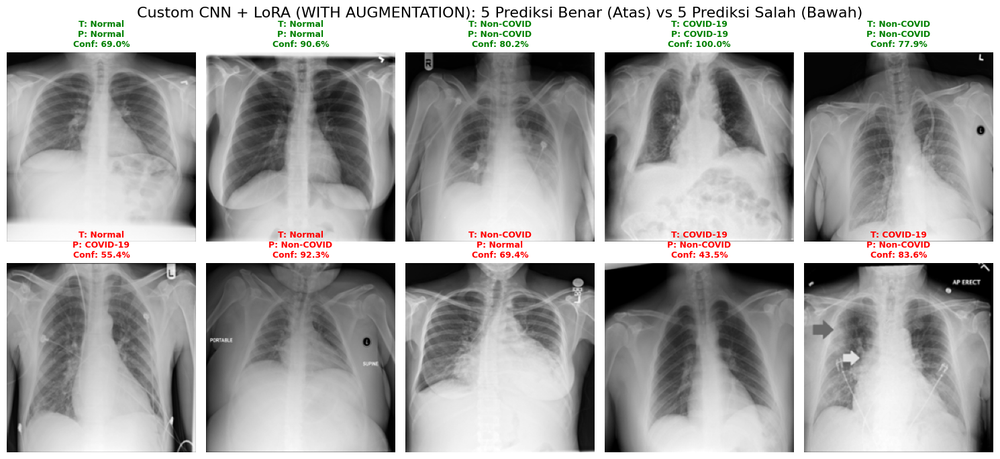

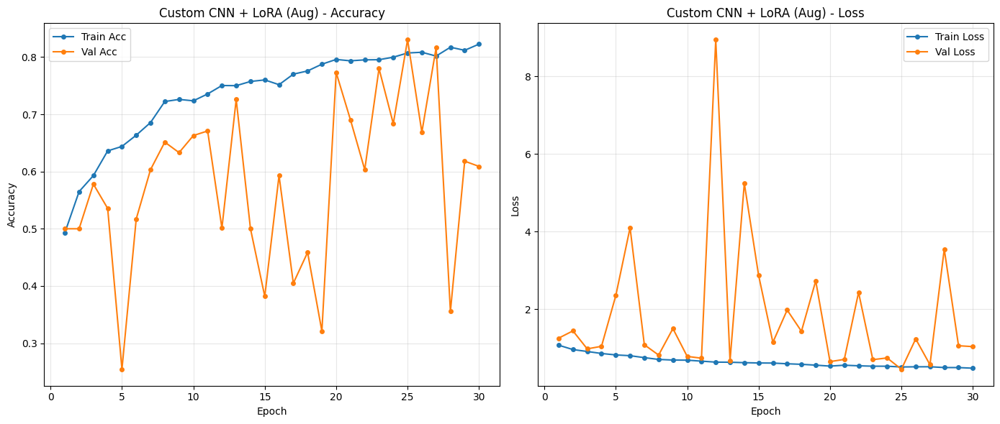

In [21]:
# %%
# 13. EVALUASI & KURVA TRAINING MODEL 1B (AUG)
if checkpoint_path_cnn_aug.exists():
    cnn_aug_model.load_weights(checkpoint_path_cnn_aug)

df_cnn_aug_results, df_cnn_aug_report = evaluate_keras_model(
    cnn_aug_model,
    test_ds_gray,
    test_idx,
    prefix="custom_lora_aug",
    title_prefix="Custom CNN + LoRA (WITH AUGMENTATION)"
)

hist = history_cnn_aug.history
epochs_range = range(1, len(hist['accuracy']) + 1)
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, hist['accuracy'], label='Train Acc', marker='o', markersize=4)
plt.plot(epochs_range, hist['val_accuracy'], label='Val Acc', marker='o', markersize=4)
plt.title('Custom CNN + LoRA (Aug) - Accuracy')
plt.xlabel('Epoch'); plt.ylabel('Accuracy')
plt.legend(); plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(epochs_range, hist['loss'], label='Train Loss', marker='o', markersize=4)
plt.plot(epochs_range, hist['val_loss'], label='Val Loss', marker='o', markersize=4)
plt.title('Custom CNN + LoRA (Aug) - Loss')
plt.xlabel('Epoch'); plt.ylabel('Loss')
plt.legend(); plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [22]:
# %%
# ==========================================
# 14. MODEL 2: LoRA DENSENET121 (TRANSFER LEARNING, DENGAN AUG)
# ==========================================
def build_lora_densenet(input_shape=(224, 224, 3), num_classes=3, rank=16):
    base_model = tf.keras.applications.DenseNet121(
        include_top=False,
        weights='imagenet',
        input_shape=input_shape
    )
    base_model.trainable = False
    
    inputs = layers.Input(shape=input_shape)
    x = data_augmentation(inputs)
    x = base_model(x, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.3)(x)
    
    x = LoRADense(units=256, rank=rank, activation='relu', name='densenet_lora_dense')(x)
    x = layers.Dropout(0.3)(x)
    
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    
    model = models.Model(inputs, outputs, name="LoRA_DenseNet121")
    return model

lora_densenet_model = build_lora_densenet(rank=32)
lora_densenet_model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)
lora_densenet_model.summary()

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "LoRA_DenseNet121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ densenet121 (Functional)        │ (None, 7, 7, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ densenet_lora_dense (LoRADense) │ (None, 256)            │       303,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │           771 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,341,635 (28.01 MB)

 Trainable params: 41,987 (164.01 KB)

 Non-trainable params: 7,299,648 (27.85 MB)

In [23]:
# %%
# 15. TRAINING LoRA DENSENET121
checkpoint_path_densenet = ARTIFACTS / "best_lora_densenet.h5"
history_path_densenet    = ARTIFACTS / "history_lora_densenet.pkl"

if checkpoint_path_densenet.exists() and history_path_densenet.exists():
    print("🔁 Menemukan checkpoint & history untuk LoRA DenseNet121.")
    print("   Skip training, load history dari disk saja.")
    
    with open(history_path_densenet, "rb") as f:
        hist_dict = pickle.load(f)
    
    history_densenet = type("History", (), {})()
    history_densenet.history = hist_dict
else:
    print("🚀 Training LoRA DenseNet121 dari awal...")

    history_densenet = lora_densenet_model.fit(
        train_ds_rgb,
        validation_data=val_ds_rgb,
        epochs=25,
        class_weight=CLASS_WEIGHTS,
        callbacks=[
            callbacks.ModelCheckpoint(
                checkpoint_path_densenet,
                save_best_only=True,
                monitor='val_loss',
                verbose=1
            ),
            callbacks.EarlyStopping(
                monitor='val_loss',
                patience=6,
                restore_best_weights=True,
                verbose=1
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=3,
                verbose=1
            )
        ]
    )

    with open(history_path_densenet, "wb") as f:
        pickle.dump(history_densenet.history, f)
    print("💾 History LoRA DenseNet121 disimpan ke:", history_path_densenet)


🔁 Menemukan checkpoint & history untuk LoRA DenseNet121.
   Skip training, load history dari disk saja.



--- Evaluasi LoRA DenseNet121 pada Test Set ---
28/28 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step

📊 Test Accuracy (lora_densenet): 82.04%

=== Contoh Hasil Prediksi (10 Sampel Acak) ===


,File Path,True Label,Predicted Label,Confidence,Prob (COVID-19),Prob (Non-COVID),Prob (Normal),Status
152,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.980632,0.980632,0.019340,2.738843e-05,CORRECT
399,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.997368,0.997368,0.002622,9.975003e-06,CORRECT
40,/kaggle/input/covidqu/Infection Segmentation D...,Normal,Normal,0.997207,0.000434,0.002359,9.972073e-01,CORRECT
556,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.734675,0.734675,0.253465,1.186036e-02,CORRECT
167,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.938961,0.938961,0.060292,7.471901e-04,CORRECT
254,/kaggle/input/covidqu/Infection Segmentation D...,Non-COVID,COVID-19,0.405841,0.405841,0.209166,3.849921e-01,WRONG
56,/kaggle/input/covidqu/Infection Segmentation D...,Normal,Normal,0.925543,0.025155,0.049302,9.255430e-01,CORRECT
660,/kaggle/input/covidqu/Infection Segmentation D...,Non-COVID,Normal,0.633035,0.258301,0.108664,6.330346e-01,WRONG
395,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.998582,0.998582,0.001417,1.174763e-07,CORRECT
5,/kaggle/input/covidqu/Infection Segmentation D...,Non-COVID,Normal,0.542301,0.004496,0.453203,5.423011e-01,WRONG



Confusion Matrix:
[[379  22  36]
 [ 39 143  37]
 [ 12  11 195]]


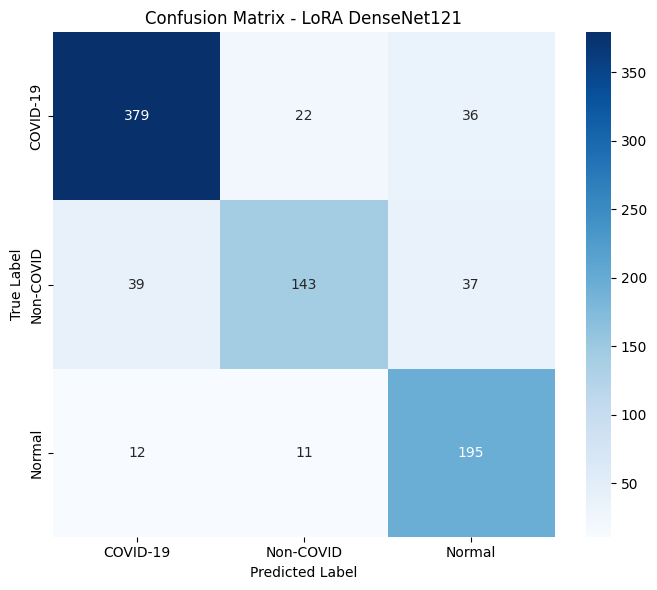


📋 Classification Report:


,precision,recall,f1-score,support
COVID-19,0.8814,0.8673,0.8743,437.0000
Non-COVID,0.8125,0.6530,0.7241,219.0000
Normal,0.7276,0.8945,0.8025,218.0000
accuracy,0.8204,0.8204,0.8204,0.8204
macro avg,0.8072,0.8049,0.8003,874.0000
weighted avg,0.8258,0.8204,0.8187,874.0000



💾 Laporan tersimpan di: artifacts/classification_report_lora_densenet.csv


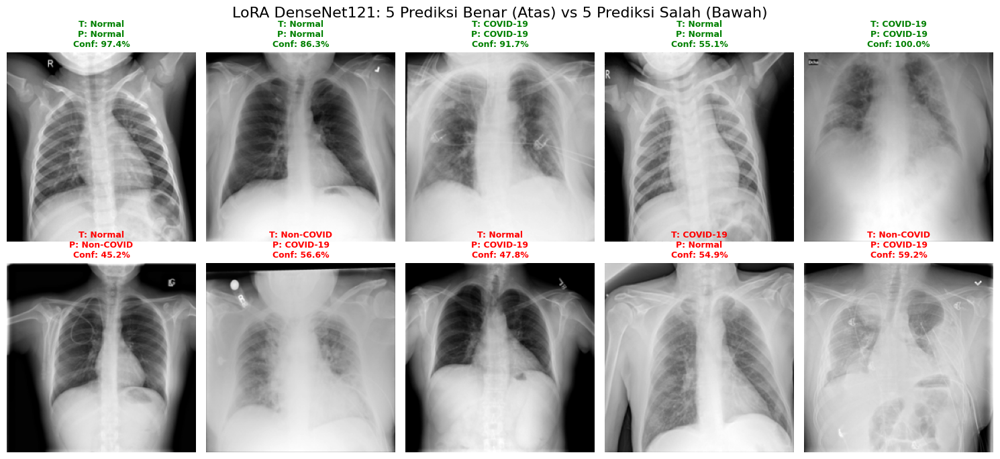

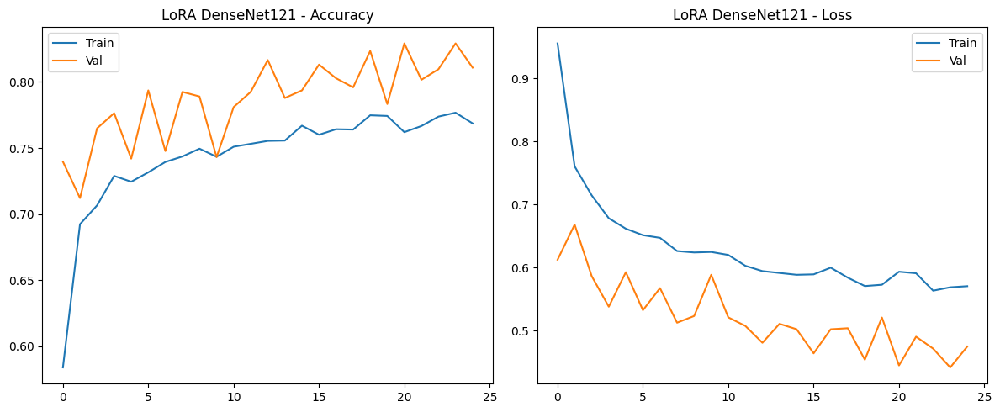


=== UPLOAD IMAGE FOR PREDICTION (LoRA DenseNet121) ===


In [24]:
# %%
# 16. EVALUASI LoRA DENSENET121 + INFERENCE
if checkpoint_path_densenet.exists():
    lora_densenet_model.load_weights(checkpoint_path_densenet)

df_dn_results, df_dn_report = evaluate_keras_model(
    lora_densenet_model,
    test_ds_rgb,
    test_idx,
    prefix="lora_densenet",
    title_prefix="LoRA DenseNet121"
)

# Kurva training
hist_dn = history_densenet.history
epochs_range = range(1, len(hist_dn['accuracy']) + 1)
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(hist_dn['accuracy'], label='Train')
plt.plot(hist_dn['val_accuracy'], label='Val')
plt.title("LoRA DenseNet121 - Accuracy"); plt.legend()
plt.subplot(1, 2, 2)
plt.plot(hist_dn['loss'], label='Train')
plt.plot(hist_dn['val_loss'], label='Val')
plt.title("LoRA DenseNet121 - Loss"); plt.legend()
plt.tight_layout()
plt.show()

# Inference single image untuk LoRA DenseNet121
try:
    import ipywidgets as widgets
    HAS_WIDGETS = True
except ImportError:
    HAS_WIDGETS = False

def predict_single_image(image_bytes=None, image_path=None):
    """
    Inferensi tunggal menggunakan LoRA DenseNet121.
    """
    if image_bytes is not None:
        arr = np.frombuffer(image_bytes, np.uint8)
        img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)
    elif image_path is not None:
        img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    else:
        print("Berikan image_bytes atau image_path.")
        return
    
    if img is None:
        print("Gambar tidak dapat dibaca.")
        return
    
    img = cv2.resize(img, TARGET_SIZE, interpolation=cv2.INTER_AREA)
    img = img.astype(np.float32) / 255.0
    img = apply_clahe(img)
    img = heuristic_lung_crop(img)
    
    img_input = np.repeat(img[..., np.newaxis], 3, axis=-1)
    img_input = np.expand_dims(img_input, axis=0)
    
    probs = lora_densenet_model.predict(img_input, verbose=0)[0]
    pred_idx = np.argmax(probs)
    pred_label = CLASSES[pred_idx]
    
    plt.figure(figsize=(5, 5))
    plt.imshow(img, cmap='gray')
    plt.title(f"Prediksi (LoRA DenseNet121): {pred_label}\nConf: {probs[pred_idx]:.2%}")
    plt.axis('off')
    plt.show()
    
    print("Probabilities:")
    for idx, label in CLASSES.items():
        print(f"{label}: {probs[idx]:.4f}")

if HAS_WIDGETS:
    print("\n=== UPLOAD IMAGE FOR PREDICTION (LoRA DenseNet121) ===")
    uploader = widgets.FileUpload(accept='.png,.jpg,.jpeg', multiple=False)
    out_wdg = widgets.Output()
    
    def on_upload_change(change):
        if not change['value']:
            return
        val = change['value']
        if isinstance(val, tuple):
            content = val[0]['content']
        elif isinstance(val, dict):
            content = list(val.values())[0]['content']
        else:
            return
        with out_wdg:
            out_wdg.clear_output()
            predict_single_image(image_bytes=content)
            
    uploader.observe(on_upload_change, names='value')
    display(widgets.VBox([uploader, out_wdg]))
else:
    print("Widget tidak tersedia. Gunakan `predict_single_image(image_path='path/to/img.jpg')`.")

In [25]:
# %%
# ==========================================
# 17. MODEL 3: VISION TRANSFORMER (ViT) KERAS (AUGMENTED)
# ==========================================
VIT_IMAGE_SIZE = TARGET_SIZE[0]
VIT_PATCH_SIZE = 16
VIT_NUM_PATCHES = (VIT_IMAGE_SIZE // VIT_PATCH_SIZE) ** 2
VIT_PROJECTION_DIM = 64
VIT_NUM_HEADS = 4
VIT_TRANSFORMER_LAYERS = 8
VIT_MLP_UNITS = [128, 64]
VIT_DROPOUT_RATE = 0.1

print(
    f"🔧 ViT Config -> PATCH_SIZE={VIT_PATCH_SIZE}, NUM_PATCHES={VIT_NUM_PATCHES}, "
    f"PROJ_DIM={VIT_PROJECTION_DIM}, HEADS={VIT_NUM_HEADS}"
)

class Patches(layers.Layer):
    def __init__(self, patch_size, **kwargs):
        super().__init__(**kwargs)
        self.patch_size = patch_size

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, (batch_size, -1, patch_dims))
        return patches

    def get_config(self):
        config = super().get_config()
        config.update({"patch_size": self.patch_size})
        return config

class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim, **kwargs):
        super().__init__(**kwargs)
        self.num_patches = num_patches
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(
            input_dim=num_patches, output_dim=projection_dim
        )

    def call(self, patch):
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        encoded = self.projection(patch) + self.position_embedding(positions)
        return encoded

    def get_config(self):
        config = super().get_config()
        config.update({
            "num_patches": self.num_patches,
            "projection_dim": self.projection.units,
        })
        return config

def vit_mlp(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

def build_vit_classifier(
    input_shape=(224, 224, 1),
    num_classes=3,
    patch_size=VIT_PATCH_SIZE,
    projection_dim=VIT_PROJECTION_DIM,
    num_heads=VIT_NUM_HEADS,
    transformer_layers=VIT_TRANSFORMER_LAYERS,
):
    inputs = layers.Input(shape=input_shape)
    x = data_augmentation(inputs)  # pakai augmentasi
    
    patches = Patches(patch_size, name="vit_patches")(x)
    encoded_patches = PatchEncoder(VIT_NUM_PATCHES, projection_dim,
                                   name="vit_patch_encoder")(patches)

    for i in range(transformer_layers):
        x1 = layers.LayerNormalization(epsilon=1e-6, name=f"ln_1_block_{i}")(encoded_patches)
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads,
            key_dim=projection_dim,
            dropout=VIT_DROPOUT_RATE,
            name=f"mha_block_{i}"
        )(x1, x1)
        x2 = layers.Add(name=f"skip_1_block_{i}")([attention_output, encoded_patches])

        x3 = layers.LayerNormalization(epsilon=1e-6, name=f"ln_2_block_{i}")(x2)
        x3 = vit_mlp(
            x3,
            hidden_units=[projection_dim * 2, projection_dim],
            dropout_rate=VIT_DROPOUT_RATE,
        )
        encoded_patches = layers.Add(name=f"skip_2_block_{i}")([x3, x2])

    representation = layers.LayerNormalization(epsilon=1e-6, name="ln_head")(encoded_patches)
    representation = layers.GlobalAveragePooling1D(name="gap_tokens")(representation)
    representation = layers.Dropout(0.5, name="head_dropout")(representation)
    features = vit_mlp(
        representation,
        hidden_units=VIT_MLP_UNITS,
        dropout_rate=0.3,
    )
    logits = layers.Dense(num_classes, activation="softmax", name="vit_logits")(features)

    model_vit = models.Model(inputs=inputs, outputs=logits, name="VisionTransformer_224x224")
    return model_vit

vit_model = build_vit_classifier(
    input_shape=(TARGET_SIZE[0], TARGET_SIZE[1], 1),
    num_classes=len(CLASSES)
)

try:
    vit_optimizer = optimizers.AdamW(learning_rate=3e-4, weight_decay=1e-4)
    print("✅ Menggunakan AdamW untuk ViT.")
except AttributeError:
    vit_optimizer = optimizers.Adam(learning_rate=3e-4)
    print("⚠️ AdamW tidak tersedia, fallback ke Adam biasa.")

vit_model.compile(
    optimizer=vit_optimizer,
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)
vit_model.summary()

🔧 ViT Config -> PATCH_SIZE=16, NUM_PATCHES=196, PROJ_DIM=64, HEADS=4
✅ Menggunakan AdamW untuk ViT.


Model: "VisionTransformer_224x224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ data_augmentation   │ (None, 224, 224,  │          0 │ input_layer_5[0]… │
│ (Sequential)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vit_patches         │ (None, None, 256) │          0 │ data_augmentatio… │
│ (Patches)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vit_patch_encoder   │ (None, 196, 64)   │     28,992 │ vit_patches[0][0] │
│ (PatchEncoder)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ln_1_block_0        │ (None, 196, 64)   │        128 │ vit_patch_encode… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mha_block_0         │ (None, 196, 64)   │     66,368 │ ln_1_block_0[0][… │
│ (MultiHeadAttentio… │                   │            │ ln_1_block_0[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ skip_1_block_0      │ (None, 196, 64)   │          0 │ mha_block_0[0][0… │
│ (Add)               │                   │            │ vit_patch_encode… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ln_2_block_0        │ (None, 196, 64)   │        128 │ skip_1_block_0[0… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 196, 128)  │      8,320 │ ln_2_block_0[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 196, 128)  │          0 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 196, 64)   │      8,256 │ dropout_7[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_8 (Dropout) │ (None, 196, 64)   │          0 │ dense_5[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ skip_2_block_0      │ (None, 196, 64)   │          0 │ dropout_8[0][0],  │
│ (Add)               │                   │            │ skip_1_block_0[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ln_1_block_1        │ (None, 196, 64)   │        128 │ skip_2_block_0[0… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mha_block_1         │ (None, 196, 64)   │     66,368 │ ln_1_block_1[0][… │
│ (MultiHeadAttentio… │                   │            │ ln_1_block_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ skip_1_block_1      │ (None, 196, 64)   │          0 │ mha_block_1[0][0… │
│ (Add)               │                   │            │ skip_2_block_0[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ln_2_block_1        │ (None, 196, 64)   │        128 │ skip_1_block_1[0… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 196, 128)  │      8,320 │ ln_2_block_1[0][… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 711,491 (2.71 MB)

 Trainable params: 711,491 (2.71 MB)

 Non-trainable params: 0 (0.00 B)

In [26]:
# %%
# 18. TRAINING ViT KERAS
cw_vit = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(Y),
    y=Y[train_idx]
)
class_weights_vit = dict(enumerate(cw_vit))
print("Class Weights (ViT):", class_weights_vit)

vit_checkpoint_path = ARTIFACTS / "best_vit_model.h5"
vit_history_path    = ARTIFACTS / "history_vit.pkl"

if vit_checkpoint_path.exists() and vit_history_path.exists():
    print("🔁 Menemukan checkpoint & history untuk ViT (Keras).")
    print("   Skip training, load history dari disk saja.")
    
    with open(vit_history_path, "rb") as f:
        hist_dict = pickle.load(f)
    
    vit_history = type("History", (), {})()
    vit_history.history = hist_dict
else:
    print("🚀 Training ViT (Keras) dari awal...")

    vit_history = vit_model.fit(
        train_ds_gray,
        validation_data=val_ds_gray,
        epochs=30,
        class_weight=class_weights_vit,
        callbacks=[
            callbacks.ModelCheckpoint(
                vit_checkpoint_path,
                save_best_only=True,
                monitor="val_loss",
                verbose=1
            ),
            callbacks.EarlyStopping(
                monitor="val_loss",
                patience=8,
                restore_best_weights=True,
                verbose=1
            ),
            callbacks.ReduceLROnPlateau(
                monitor="val_loss",
                factor=0.5,
                patience=4,
                verbose=1
            ),
        ]
    )

    with open(vit_history_path, "wb") as f:
        pickle.dump(vit_history.history, f)
    print("💾 History ViT (Keras) disimpan ke:", vit_history_path)


Class Weights (ViT): {0: 0.6666666666666666, 1: 1.3333333333333333, 2: 1.3333333333333333}
🔁 Menemukan checkpoint & history untuk ViT (Keras).
   Skip training, load history dari disk saja.


✅ Loaded best ViT weights.

--- Evaluasi Vision Transformer (Keras) pada Test Set ---
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

📊 Test Accuracy (vit_keras): 68.54%

=== Contoh Hasil Prediksi (10 Sampel Acak) ===


,File Path,True Label,Predicted Label,Confidence,Prob (COVID-19),Prob (Non-COVID),Prob (Normal),Status
565,/kaggle/input/covidqu/Infection Segmentation D...,Normal,COVID-19,0.521955,0.521955,0.154716,0.323329,WRONG
714,/kaggle/input/covidqu/Infection Segmentation D...,Non-COVID,Non-COVID,0.361119,0.359974,0.361119,0.278907,CORRECT
351,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,Normal,0.679386,0.117990,0.202624,0.679386,WRONG
185,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.613982,0.613982,0.238398,0.147621,CORRECT
719,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.543476,0.543476,0.169663,0.286861,CORRECT
668,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,Non-COVID,0.660125,0.265141,0.660125,0.074734,WRONG
556,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.742896,0.742896,0.133730,0.123374,CORRECT
70,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.639948,0.639948,0.229703,0.130349,CORRECT
94,/kaggle/input/covidqu/Infection Segmentation D...,Non-COVID,COVID-19,0.690104,0.690104,0.172088,0.137808,WRONG
129,/kaggle/input/covidqu/Infection Segmentation D...,Non-COVID,Non-COVID,0.663430,0.142061,0.663430,0.194509,CORRECT



Confusion Matrix:
[[316  59  62]
 [ 44 127  48]
 [ 38  24 156]]


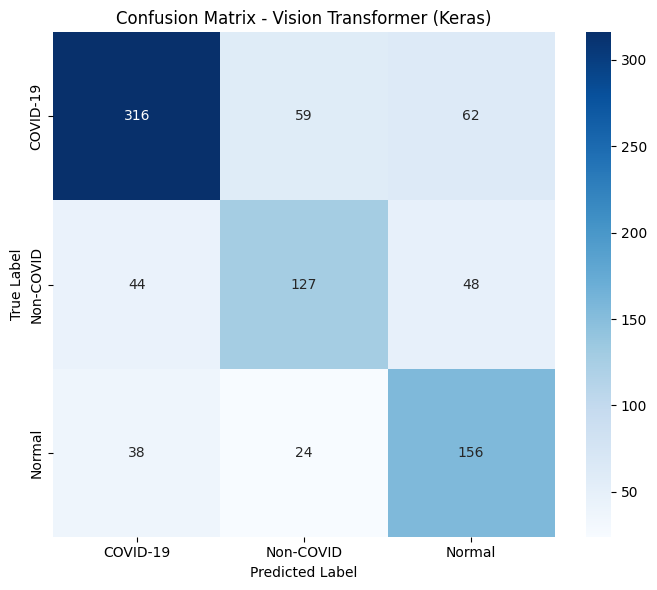


📋 Classification Report:


,precision,recall,f1-score,support
COVID-19,0.7940,0.7231,0.7569,437.0000
Non-COVID,0.6048,0.5799,0.5921,219.0000
Normal,0.5865,0.7156,0.6446,218.0000
accuracy,0.6854,0.6854,0.6854,0.6854
macro avg,0.6617,0.6729,0.6645,874.0000
weighted avg,0.6948,0.6854,0.6876,874.0000



💾 Laporan tersimpan di: artifacts/classification_report_vit_keras.csv


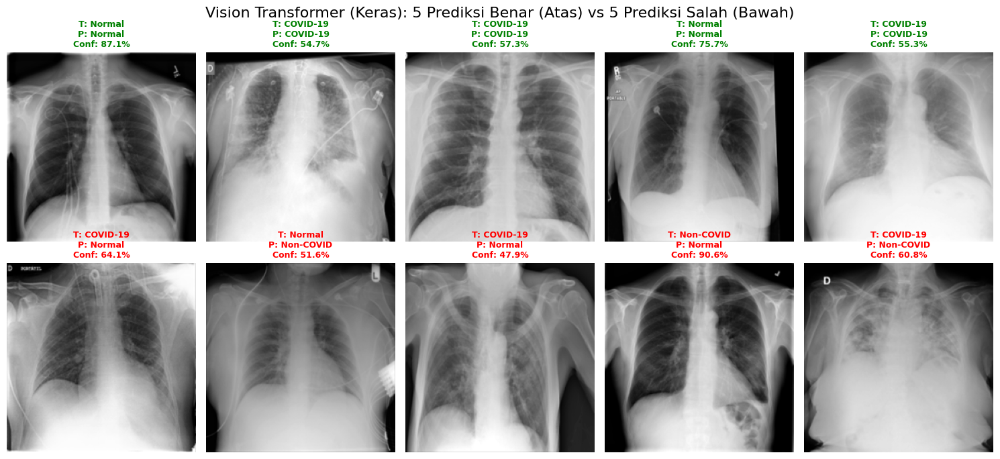

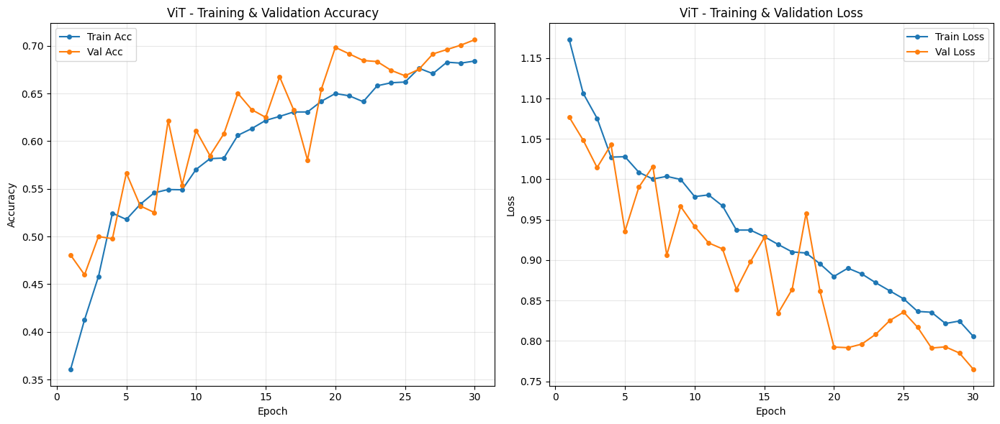

In [27]:
# %%
# 19. EVALUASI & KURVA TRAINING ViT KERAS
if vit_checkpoint_path.exists():
    vit_model.load_weights(vit_checkpoint_path)
    print("✅ Loaded best ViT weights.")

df_vit_results, df_vit_report = evaluate_keras_model(
    vit_model,
    test_ds_gray,
    test_idx,
    prefix="vit_keras",
    title_prefix="Vision Transformer (Keras)"
)

vit_hist = vit_history.history
epochs_range = range(1, len(vit_hist['accuracy']) + 1)
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, vit_hist['accuracy'], label='Train Acc', marker='o', markersize=4)
plt.plot(epochs_range, vit_hist['val_accuracy'], label='Val Acc', marker='o', markersize=4)
plt.title('ViT - Training & Validation Accuracy')
plt.xlabel('Epoch'); plt.ylabel('Accuracy')
plt.legend(); plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(epochs_range, vit_hist['loss'], label='Train Loss', marker='o', markersize=4)
plt.plot(epochs_range, vit_hist['val_loss'], label='Val Loss', marker='o', markersize=4)
plt.title('ViT - Training & Validation Loss')
plt.xlabel('Epoch'); plt.ylabel('Loss')
plt.legend(); plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [28]:

# %%
# 20. INFERENCE SINGLE IMAGE UNTUK ViT KERAS
try:
    import ipywidgets as widgets
    HAS_WIDGETS_VIT = True
except ImportError:
    HAS_WIDGETS_VIT = False

def vit_predict_single_image(image_bytes=None, image_path=None):
    if image_bytes is None and image_path is None:
        print("Harap berikan image_bytes atau image_path.")
        return

    if image_bytes is not None:
        arr = np.frombuffer(image_bytes, np.uint8)
        img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)
    else:
        img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)

    if img is None:
        print("Gambar tidak dapat dibaca.")
        return

    img = cv2.resize(img, TARGET_SIZE, interpolation=cv2.INTER_AREA)
    img = img.astype(np.float32) / 255.0
    img = apply_clahe(img)
    img = heuristic_lung_crop(img)

    img_input = img[..., np.newaxis]
    img_input = np.expand_dims(img_input, axis=0)

    probs = vit_model.predict(img_input, verbose=0)[0]
    pred_idx = np.argmax(probs)
    pred_label = CLASSES[pred_idx]

    plt.figure(figsize=(5, 5))
    plt.imshow(img, cmap='gray')
    plt.title(f"ViT - Prediksi: {pred_label}\nConf: {probs[pred_idx]:.2%}")
    plt.axis('off')
    plt.show()

    print("Probabilities (ViT):")
    for idx, label in CLASSES.items():
        print(f"{label}: {probs[idx]:.4f}")

if HAS_WIDGETS_VIT:
    print("\n=== UPLOAD IMAGE FOR ViT PREDICTION ===")
    uploader_vit = widgets.FileUpload(accept='.png,.jpg,.jpeg', multiple=False)
    out_vit = widgets.Output()

    def on_upload_change_vit(change):
        if not change['value']:
            return
        val = change['value']
        if isinstance(val, tuple):
            content = val[0]['content']
        elif isinstance(val, dict):
            content = list(val.values())[0]['content']
        else:
            return
        with out_vit:
            out_vit.clear_output()
            vit_predict_single_image(image_bytes=content)

    uploader_vit.observe(on_upload_change_vit, names='value')
    display(widgets.VBox([uploader_vit, out_vit]))
else:
    print("Widget tidak tersedia. Gunakan: vit_predict_single_image(image_path='path/to/img.jpg')")


=== UPLOAD IMAGE FOR ViT PREDICTION ===


In [30]:
# %%
# 21. PRETRAINED HF ViT (PYTORCH) + AUG DI TRAIN SET
# %pip install -q "transformers[torch]" timm accelerate

import torch
from torch.utils.data import Dataset, DataLoader
from transformers import AutoImageProcessor, ViTForImageClassification

torch.manual_seed(RANDOM_STATE)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(RANDOM_STATE)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("🔥 Using device:", device)

HF_VIT_MODEL_NAME = "google/vit-base-patch16-224-in21k"
hf_image_processor = AutoImageProcessor.from_pretrained(HF_VIT_MODEL_NAME)

id2label = {i: name for i, name in CLASSES.items()}
label2id = {name: i for i, name in CLASSES.items()}

class ChestXrayViTDataset(Dataset):
    """
    Dataset PyTorch untuk fine-tune ViT pretrained.
    augment=True hanya untuk train (flip acak).
    """
    def __init__(self, index_array, meta_df, labels_array, processor, augment=False):
        self.indices = np.array(index_array)
        self.meta_df = meta_df.reset_index(drop=True)
        self.labels_array = np.array(labels_array)
        self.processor = processor
        self.augment = augment

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        real_idx = int(self.indices[idx])
        img_path = self.meta_df.iloc[real_idx]["image_path"]
        label = int(self.labels_array[real_idx])

        img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
        if img is None:
            raise FileNotFoundError(img_path)

        img = cv2.resize(img, TARGET_SIZE, interpolation=cv2.INTER_AREA)
        img = img.astype(np.float32) / 255.0
        img = apply_clahe(img)
        img = heuristic_lung_crop(img)  # 224x224 float32 [0..1]

        img = np.stack([img, img, img], axis=-1)  # (224, 224, 3)
        img_uint8 = (img * 255.0).astype(np.uint8)

        # AUGMENTASI SEDERHANA: HORIZONTAL FLIP
        if self.augment and np.random.rand() < 0.5:
            img_uint8 = cv2.flip(img_uint8, 1)

        encoding = self.processor(
            images=img_uint8,
            do_resize=False,
            return_tensors="pt"
        )
        pixel_values = encoding["pixel_values"].squeeze(0)

        return {
            "pixel_values": pixel_values,
            "labels": torch.tensor(label, dtype=torch.long),
            "path": img_path,
        }

train_dataset_pt = ChestXrayViTDataset(train_idx, meta, Y, hf_image_processor, augment=True)
val_dataset_pt   = ChestXrayViTDataset(val_idx,   meta, Y, hf_image_processor, augment=False)
test_dataset_pt  = ChestXrayViTDataset(test_idx,  meta, Y, hf_image_processor, augment=False)

BATCH_SIZE_PT = 16

train_loader = DataLoader(
    train_dataset_pt,
    batch_size=BATCH_SIZE_PT,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
)
val_loader = DataLoader(
    val_dataset_pt,
    batch_size=BATCH_SIZE_PT,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)
test_loader = DataLoader(
    test_dataset_pt,
    batch_size=BATCH_SIZE_PT,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

print(f"Train batches: {len(train_loader)}, Val batches: {len(val_loader)}, Test batches: {len(test_loader)}")

hf_vit_model = ViTForImageClassification.from_pretrained(
    HF_VIT_MODEL_NAME,
    num_labels=len(CLASSES),
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
)
hf_vit_model.to(device)

cw_torch = torch.tensor(
    compute_class_weight(class_weight="balanced", classes=np.unique(Y), y=Y[train_idx]),
    dtype=torch.float32,
).to(device)
criterion = torch.nn.CrossEntropyLoss(weight=cw_torch)

optimizer = torch.optim.AdamW(hf_vit_model.parameters(), lr=5e-5, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=2, verbose=True
)

EPOCHS_PT = 10
best_val_loss = float("inf")
patience = 4
patience_counter = 0

hf_vit_ckpt_path    = ARTIFACTS / "hf_vit_pretrained_best.pt"
hf_vit_history_path = ARTIFACTS / "history_hf_vit_pretrained.pkl"

# =====================================================
#  ✅ Cek apakah model & history HF ViT sudah ada
# =====================================================
if hf_vit_ckpt_path.exists() and hf_vit_history_path.exists():
    print("\n🔁 Menemukan checkpoint & history HF ViT Pretrained.")
    print("   Skip fine-tuning, langsung load model & history dari disk.")

    hf_vit_model.load_state_dict(torch.load(hf_vit_ckpt_path, map_location=device))

    with open(hf_vit_history_path, "rb") as f:
        train_history_pt = pickle.load(f)

    print("✅ Bobot & history HF ViT berhasil dimuat.")
else:
    # belum ada model / history → jalankan training penuh
    train_history_pt = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": [],
    }

    print("\n🚀 Start fine-tuning HuggingFace ViT (pretrained) ...\n")

    for epoch in range(1, EPOCHS_PT + 1):
        hf_vit_model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for batch in train_loader:
            pixel_values = batch["pixel_values"].to(device)
            labels = batch["labels"].to(device)

            outputs = hf_vit_model(pixel_values=pixel_values, labels=labels)
            loss = outputs.loss

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * labels.size(0)
            preds = outputs.logits.argmax(dim=-1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss = running_loss / total
        train_acc = correct / total

        hf_vit_model.eval()
        val_running_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for batch in val_loader:
                pixel_values = batch["pixel_values"].to(device)
                labels = batch["labels"].to(device)

                outputs = hf_vit_model(pixel_values=pixel_values, labels=labels)
                loss = outputs.loss

                val_running_loss += loss.item() * labels.size(0)
                preds = outputs.logits.argmax(dim=-1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss = val_running_loss / val_total
        val_acc = val_correct / val_total

        scheduler.step(val_loss)

        train_history_pt["train_loss"].append(train_loss)
        train_history_pt["train_acc"].append(train_acc)
        train_history_pt["val_loss"].append(val_loss)
        train_history_pt["val_acc"].append(val_acc)

        print(
            f"[Epoch {epoch}/{EPOCHS_PT}] "
            f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} "
            f"|| Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}"
        )

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            torch.save(hf_vit_model.state_dict(), hf_vit_ckpt_path)
            print(f"  ✅ Best model updated. Saved to: {hf_vit_ckpt_path}")
        else:
            patience_counter += 1
            print(f"  🔁 No improvement. Patience: {patience_counter}/{patience}")
            if patience_counter >= patience:
                print("  ⏹️ Early stopping triggered.")
                break

    print("\n✅ Fine-tuning selesai.")

    with open(hf_vit_history_path, "wb") as f:
        pickle.dump(train_history_pt, f)
    print("💾 History HF-ViT tersimpan di:", hf_vit_history_path)

    if hf_vit_ckpt_path.exists():
        hf_vit_model.load_state_dict(torch.load(hf_vit_ckpt_path, map_location=device))
        print("✅ Loaded best HF-ViT weights dari disk.")
    else:
        print("⚠️ Best checkpoint HF-ViT tidak ditemukan, pakai bobot terakhir.")


🔥 Using device: cuda


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Train batches: 255, Val batches: 55, Test batches: 55


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



🔁 Menemukan checkpoint & history HF ViT Pretrained.
   Skip fine-tuning, langsung load model & history dari disk.
✅ Bobot & history HF ViT berhasil dimuat.



Confusion Matrix (HF ViT Pretrained):
[[421   7   9]
 [ 12 187  20]
 [  7  18 193]]


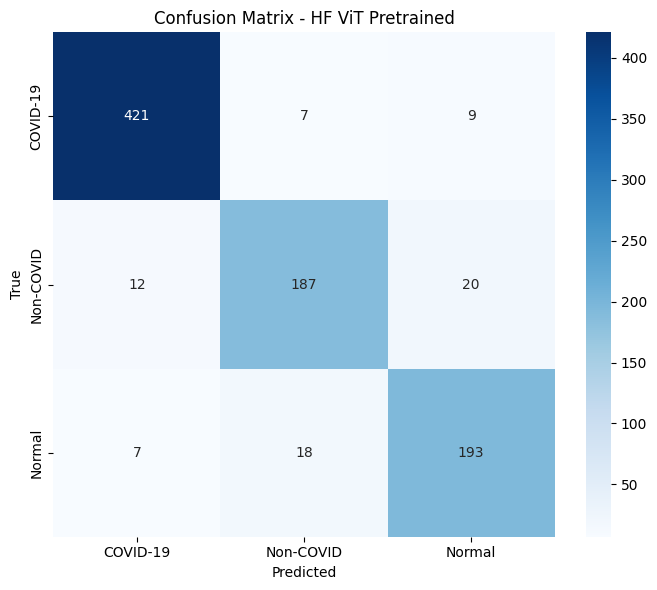


HF VISION TRANSFORMER (PRETRAINED) - CLASSIFICATION REPORT
              precision    recall  f1-score   support

    COVID-19       0.96      0.96      0.96       437
   Non-COVID       0.88      0.85      0.87       219
      Normal       0.87      0.89      0.88       218

    accuracy                           0.92       874
   macro avg       0.90      0.90      0.90       874
weighted avg       0.92      0.92      0.92       874


📋 Classification Report (DataFrame) - HF ViT:


,precision,recall,f1-score,support
COVID-19,0.9568,0.9634,0.9601,437.0000
Non-COVID,0.8821,0.8539,0.8677,219.0000
Normal,0.8694,0.8853,0.8773,218.0000
accuracy,0.9165,0.9165,0.9165,0.9165
macro avg,0.9028,0.9009,0.9017,874.0000
weighted avg,0.9163,0.9165,0.9163,874.0000



💾 Laporan HF-ViT tersimpan di: artifacts/classification_report_hf_vit_pretrained.csv

📊 Test Accuracy (HF ViT Pretrained): 91.65%


In [31]:

# %%
# 22. EVALUASI HF-ViT PRETRAINED PADA TEST SET + INFERENCE
hf_vit_model.eval()
all_logits = []
all_labels = []
all_paths = []

with torch.no_grad():
    for batch in test_loader:
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

        outputs = hf_vit_model(pixel_values=pixel_values)
        logits = outputs.logits

        all_logits.append(logits.cpu().numpy())
        all_labels.append(labels.cpu().numpy())
        all_paths.extend(batch["path"])

all_logits = np.concatenate(all_logits, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

hf_vit_probs = torch.softmax(torch.from_numpy(all_logits), dim=-1).numpy()
hf_vit_preds = np.argmax(hf_vit_probs, axis=1)

hf_cm = confusion_matrix(all_labels, hf_vit_preds)
print("\nConfusion Matrix (HF ViT Pretrained):")
print(hf_cm)

plt.figure(figsize=(7, 6))
sns.heatmap(
    hf_cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=list(CLASSES.values()),
    yticklabels=list(CLASSES.values()),
)
plt.title("Confusion Matrix - HF ViT Pretrained")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("HF VISION TRANSFORMER (PRETRAINED) - CLASSIFICATION REPORT")
print("="*60)
print(classification_report(all_labels, hf_vit_preds, target_names=list(CLASSES.values())))
print("="*60)

hf_vit_report_dict = classification_report(
    all_labels, hf_vit_preds, target_names=list(CLASSES.values()), output_dict=True
)
df_hf_vit_report = pd.DataFrame(hf_vit_report_dict).transpose()

print("\n📋 Classification Report (DataFrame) - HF ViT:")
display(df_hf_vit_report.style.format("{:.4f}"))

hf_vit_report_path = ARTIFACTS / "classification_report_hf_vit_pretrained.csv"
df_hf_vit_report.to_csv(hf_vit_report_path)
print(f"\n💾 Laporan HF-ViT tersimpan di: {hf_vit_report_path}")

hf_vit_test_acc = np.mean(all_labels == hf_vit_preds)
print(f"\n📊 Test Accuracy (HF ViT Pretrained): {hf_vit_test_acc:.2%}")

def hf_vit_predict_single_image(image_bytes=None, image_path=None):
    if image_bytes is None and image_path is None:
        print("Harap berikan image_bytes atau image_path.")
        return

    if image_bytes is not None:
        arr = np.frombuffer(image_bytes, np.uint8)
        img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)
    else:
        img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)

    if img is None:
        print("Gambar tidak dapat dibaca.")
        return

    img = cv2.resize(img, TARGET_SIZE, interpolation=cv2.INTER_AREA)
    img = img.astype(np.float32) / 255.0
    img = apply_clahe(img)
    img = heuristic_lung_crop(img)

    img_vis = img.copy()

    img = np.stack([img, img, img], axis=-1)
    img_uint8 = (img * 255.0).astype(np.uint8)

    encoding = hf_image_processor(
        images=img_uint8,
        do_resize=False,
        return_tensors="pt",
    )
    pixel_values = encoding["pixel_values"].to(device)

    hf_vit_model.eval()
    with torch.no_grad():
        outputs = hf_vit_model(pixel_values=pixel_values)
        logits = outputs.logits
        probs = torch.softmax(logits, dim=-1)[0].cpu().numpy()

    pred_idx = int(np.argmax(probs))
    pred_label = CLASSES[pred_idx]

    plt.figure(figsize=(5, 5))
    plt.imshow(img_vis, cmap="gray")
    plt.title(f"HF ViT - Prediksi: {pred_label}\nConf: {probs[pred_idx]:.2%}")
    plt.axis("off")
    plt.show()

    print("Probabilities (HF ViT):")
    for idx, label in CLASSES.items():
        print(f"{label}: {probs[idx]:.4f}")

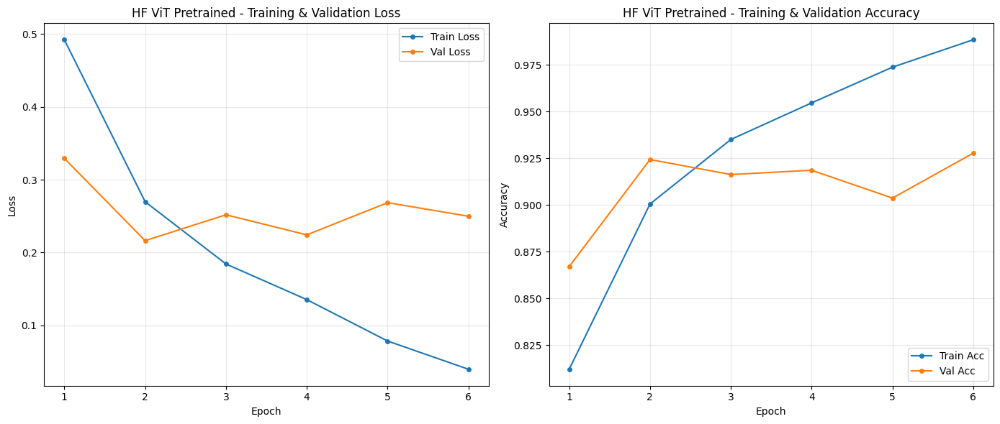

Final Train Loss (HF ViT): 0.0399
Final Val   Loss (HF ViT): 0.2498
Final Train Acc  (HF ViT): 0.9885
Final Val   Acc  (HF ViT): 0.9278


In [32]:
# %%
# ==========================================
# 23. VISUALISASI KURVA TRAINING HF ViT PRETRAINED
# ==========================================
import matplotlib.pyplot as plt
import pickle

# Path history HF ViT
hf_vit_history_path = ARTIFACTS / "history_hf_vit_pretrained.pkl"

# Ambil history dari memori atau dari file
if 'train_history_pt' in globals():
    hf_hist = train_history_pt
elif hf_vit_history_path.exists():
    print("🔄 Memuat history HF ViT dari file...")
    with open(hf_vit_history_path, "rb") as f:
        hf_hist = pickle.load(f)
else:
    print("⚠️ History HF ViT tidak ditemukan. Pastikan training sudah dijalankan.")
    hf_hist = None

# Plot kalau history tersedia
if hf_hist is not None:
    epochs_range = range(1, len(hf_hist["train_loss"]) + 1)

    plt.figure(figsize=(14, 6))

    # --- Plot Loss ---
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, hf_hist["train_loss"], label="Train Loss", marker="o", markersize=4)
    plt.plot(epochs_range, hf_hist["val_loss"], label="Val Loss", marker="o", markersize=4)
    plt.title("HF ViT Pretrained - Training & Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend(loc="upper right")
    plt.grid(True, alpha=0.3)

    # --- Plot Accuracy ---
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, hf_hist["train_acc"], label="Train Acc", marker="o", markersize=4)
    plt.plot(epochs_range, hf_hist["val_acc"], label="Val Acc", marker="o", markersize=4)
    plt.title("HF ViT Pretrained - Training & Validation Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend(loc="lower right")
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Print ringkasan akhir
    print(f"Final Train Loss (HF ViT): {hf_hist['train_loss'][-1]:.4f}")
    print(f"Final Val   Loss (HF ViT): {hf_hist['val_loss'][-1]:.4f}")
    print(f"Final Train Acc  (HF ViT): {hf_hist['train_acc'][-1]:.4f}")
    print(f"Final Val   Acc  (HF ViT): {hf_hist['val_acc'][-1]:.4f}")


📊 Menyusun hasil prediksi per-sampel untuk HF ViT Pretrained...

=== Contoh Hasil Prediksi HF ViT (10 Sampel Acak) ===


,File Path,True Label,Predicted Label,Confidence,Prob (COVID-19),Prob (Non-COVID),Prob (Normal),Status
508,/kaggle/input/covidqu/Infection Segmentation D...,Normal,Normal,0.939078,0.016176,0.044746,0.939078,CORRECT
671,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.981701,0.981701,0.010678,0.007621,CORRECT
173,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.981069,0.981069,0.010686,0.008245,CORRECT
223,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.862131,0.862131,0.049430,0.088439,CORRECT
245,/kaggle/input/covidqu/Infection Segmentation D...,Normal,Normal,0.862204,0.022286,0.115510,0.862204,CORRECT
837,/kaggle/input/covidqu/Infection Segmentation D...,Non-COVID,COVID-19,0.668546,0.668546,0.297349,0.034106,WRONG
472,/kaggle/input/covidqu/Infection Segmentation D...,Non-COVID,Non-COVID,0.840757,0.085100,0.840757,0.074143,CORRECT
287,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.800088,0.800088,0.158179,0.041733,CORRECT
126,/kaggle/input/covidqu/Infection Segmentation D...,COVID-19,COVID-19,0.825899,0.825899,0.150203,0.023898,CORRECT
666,/kaggle/input/covidqu/Infection Segmentation D...,Normal,Normal,0.887275,0.061030,0.051695,0.887275,CORRECT


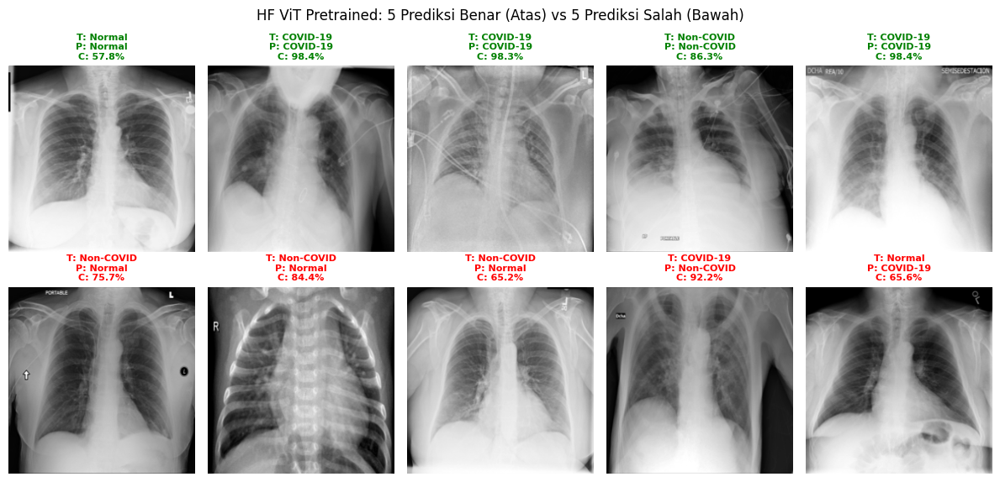

In [33]:
# %%
# ==========================================
# 24. VISUALISASI 5 BENAR vs 5 SALAH - HF ViT PRETRAINED
# ==========================================
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import cv2
import torch

print("📊 Menyusun hasil prediksi per-sampel untuk HF ViT Pretrained...")

# Recompute prediksi jika variabel belum ada di memori
if (
    'hf_vit_probs' not in globals()
    or 'hf_vit_preds' not in globals()
    or 'all_labels' not in globals()
    or 'all_paths' not in globals()
):
    hf_vit_model.eval()
    all_logits = []
    all_labels = []
    all_paths = []

    with torch.no_grad():
        for batch in test_loader:
            pixel_values = batch["pixel_values"].to(device)
            labels = batch["labels"].to(device)

            outputs = hf_vit_model(pixel_values=pixel_values)
            logits = outputs.logits

            all_logits.append(logits.cpu().numpy())
            all_labels.append(labels.cpu().numpy())
            all_paths.extend(batch["path"])

    all_logits = np.concatenate(all_logits, axis=0)   # [N_test, num_classes]
    all_labels = np.concatenate(all_labels, axis=0)   # [N_test]
    hf_vit_probs = torch.softmax(torch.from_numpy(all_logits), dim=-1).numpy()
    hf_vit_preds = np.argmax(hf_vit_probs, axis=1)

# Buat DataFrame hasil
df_hf_vit_results = pd.DataFrame({
    "File Path": all_paths,
    "True Label": [CLASSES[int(i)] for i in all_labels],
    "Predicted Label": [CLASSES[int(i)] for i in hf_vit_preds],
    "Confidence": hf_vit_probs.max(axis=1),
    "Prob (COVID-19)": hf_vit_probs[:, 0],
    "Prob (Non-COVID)": hf_vit_probs[:, 1],
    "Prob (Normal)": hf_vit_probs[:, 2],
})
df_hf_vit_results["Status"] = np.where(
    df_hf_vit_results["True Label"] == df_hf_vit_results["Predicted Label"],
    "CORRECT",
    "WRONG"
)

print("\n=== Contoh Hasil Prediksi HF ViT (10 Sampel Acak) ===")
display(df_hf_vit_results.sample(10))

# Split benar & salah
hf_correct = df_hf_vit_results[df_hf_vit_results["Status"] == "CORRECT"]
hf_wrong   = df_hf_vit_results[df_hf_vit_results["Status"] == "WRONG"]

def plot_hf_vit_samples(df_subset, row_idx, color):
    if df_subset.empty:
        return
    samples = df_subset.sample(min(5, len(df_subset)), random_state=42)
    for i, (_, row) in enumerate(samples.iterrows()):
        plt.subplot(2, 5, row_idx * 5 + (i + 1))
        img = cv2.imread(row["File Path"], cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, TARGET_SIZE)
        plt.imshow(img, cmap="gray")
        plt.axis("off")
        plt.title(
            f"T: {row['True Label']}\nP: {row['Predicted Label']}\nC: {row['Confidence']:.1%}",
            color=color,
            fontsize=8,
            weight="bold"
        )

plt.figure(figsize=(12, 6))
plot_hf_vit_samples(hf_correct, row_idx=0, color="green")
plot_hf_vit_samples(hf_wrong,   row_idx=1, color="red")
plt.suptitle("HF ViT Pretrained: 5 Prediksi Benar (Atas) vs 5 Prediksi Salah (Bawah)")
plt.tight_layout()
plt.show()

📂 Ditemukan file classification_report berikut di ARTIFACTS:
 - classification_report_custom_lora_aug.csv
 - classification_report_custom_lora_noaug.csv
 - classification_report_hf_vit_pretrained.csv
 - classification_report_lora_densenet.csv
 - classification_report_vit_keras.csv

🧮 Tabel Perbandingan Model (Overall):


,Model,Accuracy,Macro F1,Weighted F1,F1 COVID-19,F1 Non-COVID,F1 Normal
Model ID,,,,,,,
custom_cnn_aug,"Custom CNN (+Aug, LoRA Head)",0.8135,0.7825,0.8093,0.8901,0.6601,0.7972
custom_cnn_noaug,"Custom CNN (No Aug, LoRA Head)",0.7174,0.6586,0.7024,0.8342,0.4788,0.6627
hf_vit_pretrained,HF ViT Pretrained,0.9165,0.9017,0.9163,0.9601,0.8677,0.8773
lora_densenet121,DenseNet121 + LoRA,0.8204,0.8003,0.8187,0.8743,0.7241,0.8025
vit_keras,ViT (Keras),0.6854,0.6645,0.6876,0.7569,0.5921,0.6446


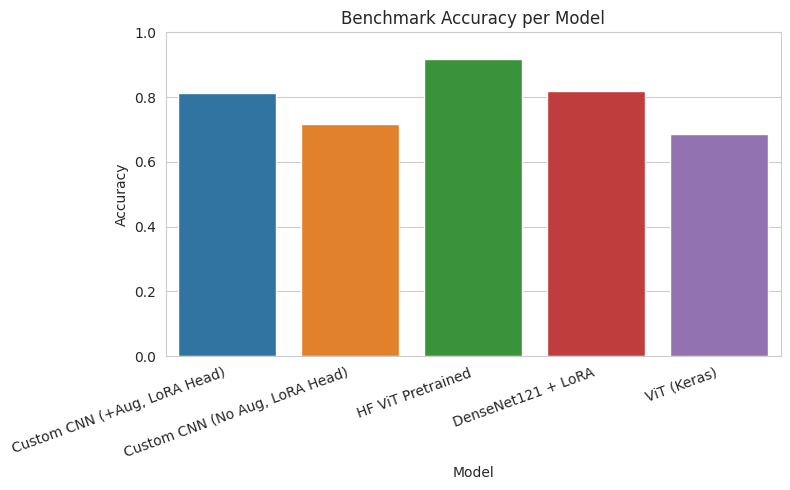

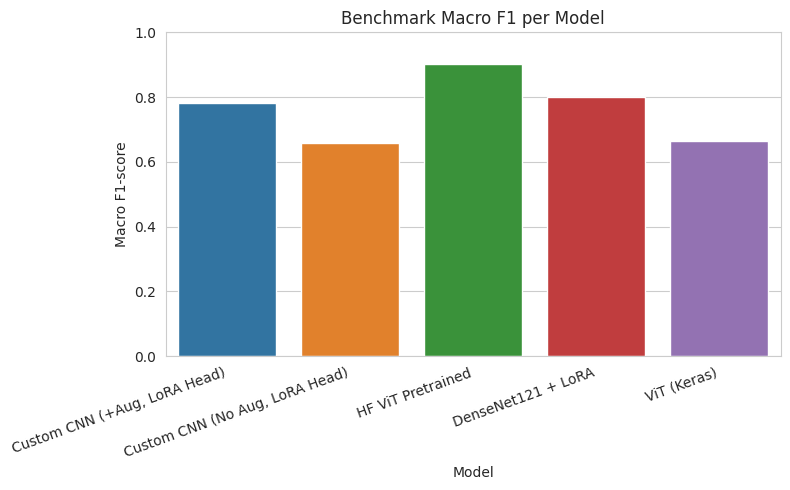

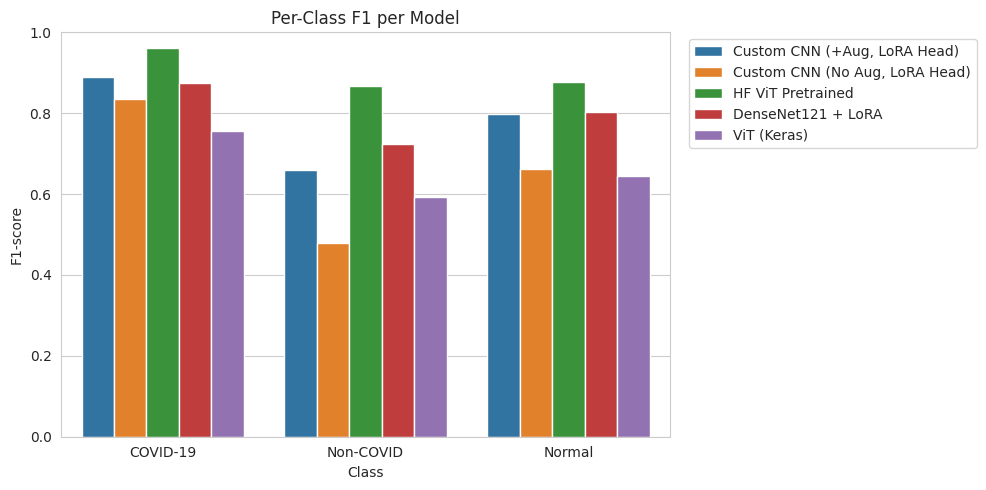

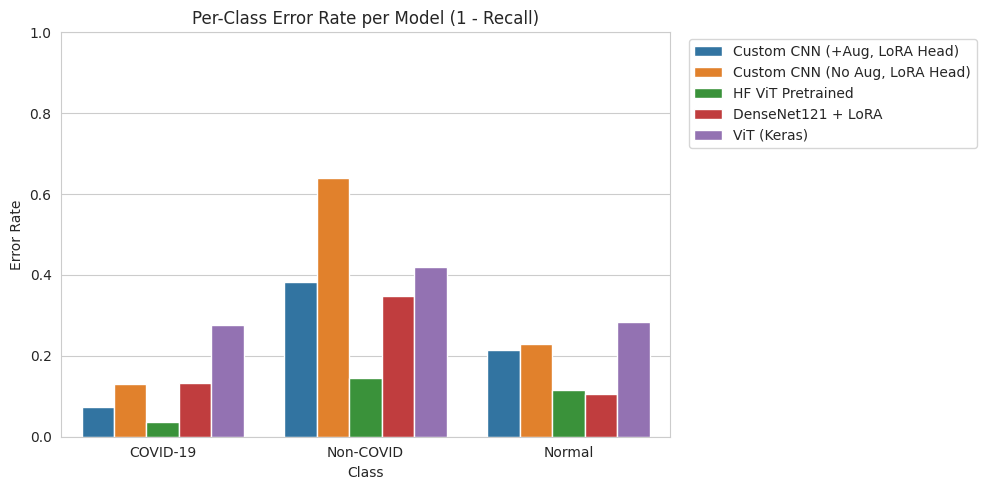

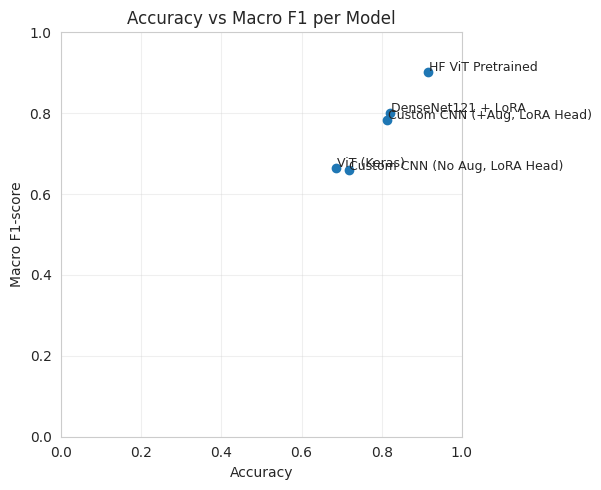

In [34]:
# %%
# ==========================================
# 25. BENCHMARK & ERROR ANALYSIS ANTAR SEMUA MODEL
# ==========================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

sns.set_style("whitegrid")

ARTIFACTS = Path("./artifacts")

# Cari semua classification_report*.csv yang sudah disimpan
csv_files = sorted(ARTIFACTS.glob("classification_report*.csv"))
print("📂 Ditemukan file classification_report berikut di ARTIFACTS:")
for p in csv_files:
    print(" -", p.name)

if not csv_files:
    print("❌ Tidak ada classification_report*.csv di folder ARTIFACTS. Pastikan setiap model sudah menyimpan report-nya.")
else:
    # ---------------------------------------------------
    # Mapping EXPLICIT: nama file -> (model_id, label enak)
    # ---------------------------------------------------
    name_map = {
        "classification_report_custom_lora_noaug.csv": (
            "custom_cnn_noaug",
            "Custom CNN (No Aug, LoRA Head)",
        ),
        "classification_report_custom_lora_aug.csv": (
            "custom_cnn_aug",
            "Custom CNN (+Aug, LoRA Head)",
        ),
        "classification_report_lora_densenet.csv": (
            "lora_densenet121",
            "DenseNet121 + LoRA",
        ),
        "classification_report_vit_keras.csv": (
            "vit_keras",
            "ViT (Keras)",
        ),
        "classification_report_hf_vit_pretrained.csv": (
            "hf_vit_pretrained",
            "HF ViT Pretrained",
        ),
        # fallback generik kalau nanti ada file lain
        "classification_report.csv": (
            "custom_cnn_lora_aug",
            "Custom CNN (LoRA) + Aug",
        ),
    }

    model_summaries = []
    per_class_rows = []

    # Nama kelas diambil dari CLASSES (harus sudah didefinisikan di atas)
    class_names = list(CLASSES.values())

    for path in csv_files:
        fname = path.name

        if fname in name_map:
            model_id, pretty_name = name_map[fname]
        else:
            # fallback: generate dari nama file
            model_id = fname.replace("classification_report_", "").replace(".csv", "")
            pretty_name = model_id.replace("_", " ").title()

        df = pd.read_csv(path, index_col=0)

        # -----------------------------
        # Summary metric per model
        # -----------------------------
        # Row 'accuracy' di sklearn punya value akurasi di kolom 'precision' (konvensi classification_report)
        try:
            acc = df.loc["accuracy", "precision"]
        except KeyError:
            # fallback kalau format beda
            acc = df.loc["accuracy"].max()

        macro_f1 = df.loc["macro avg", "f1-score"]
        weighted_f1 = df.loc["weighted avg", "f1-score"]

        # Per-class F1 / precision / recall
        f1_per_class = {}
        for cname in class_names:
            if cname in df.index:
                f1 = df.loc[cname, "f1-score"]
                prec = df.loc[cname, "precision"]
                rec = df.loc[cname, "recall"]
                supp = df.loc[cname, "support"]
                f1_per_class[cname] = f1

                per_class_rows.append({
                    "Model ID": model_id,
                    "Model": pretty_name,
                    "Class": cname,
                    "F1": f1,
                    "Precision": prec,
                    "Recall": rec,
                    "Error Rate": 1.0 - rec,
                    "Support": supp,
                })

        model_summaries.append({
            "Model ID": model_id,
            "Model": pretty_name,
            "Accuracy": acc,
            "Macro F1": macro_f1,
            "Weighted F1": weighted_f1,
            **{f"F1 {c}": f1_per_class.get(c, np.nan) for c in class_names},
        })

    # DataFrame benchmark utama
    df_bench = pd.DataFrame(model_summaries).set_index("Model ID")
    df_per_class = pd.DataFrame(per_class_rows)

    # -----------------------------
    # Tabel perbandingan model (overall)
    # -----------------------------
    print("\n🧮 Tabel Perbandingan Model (Overall):")
    cols_order = ["Model", "Accuracy", "Macro F1", "Weighted F1"] + [f"F1 {c}" for c in class_names]
    df_show = df_bench[cols_order].copy()
    display(df_show.round(4))

    # -----------------------------
    # Plot 1: Accuracy per model
    # -----------------------------
    plt.figure(figsize=(8, 5))
    sns.barplot(
        data=df_bench.reset_index(),
        x="Model",
        y="Accuracy"
    )
    plt.title("Benchmark Accuracy per Model")
    plt.ylim(0, 1.0)
    plt.xticks(rotation=20, ha="right")
    plt.ylabel("Accuracy")
    plt.tight_layout()
    plt.show()

    # -----------------------------
    # Plot 2: Macro F1 per model
    # -----------------------------
    plt.figure(figsize=(8, 5))
    sns.barplot(
        data=df_bench.reset_index(),
        x="Model",
        y="Macro F1"
    )
    plt.title("Benchmark Macro F1 per Model")
    plt.ylim(0, 1.0)
    plt.xticks(rotation=20, ha="right")
    plt.ylabel("Macro F1-score")
    plt.tight_layout()
    plt.show()

    # -----------------------------
    # Plot 3: Per-class F1 (grouped bar)
    # -----------------------------
    plt.figure(figsize=(10, 5))
    sns.barplot(
        data=df_per_class,
        x="Class",
        y="F1",
        hue="Model",
    )
    plt.title("Per-Class F1 per Model")
    plt.ylim(0, 1.0)
    plt.ylabel("F1-score")
    plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

    # -----------------------------
    # Plot 4: Per-class Error Rate (1 - Recall)
    # -----------------------------
    plt.figure(figsize=(10, 5))
    sns.barplot(
        data=df_per_class,
        x="Class",
        y="Error Rate",
        hue="Model",
    )
    plt.title("Per-Class Error Rate per Model (1 - Recall)")
    plt.ylim(0, 1.0)
    plt.ylabel("Error Rate")
    plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

    # -----------------------------
    # Plot 5 (opsional): Scatter Accuracy vs Macro F1
    # -----------------------------
    plt.figure(figsize=(6, 5))
    plt.scatter(df_bench["Accuracy"], df_bench["Macro F1"])
    for _, row in df_bench.iterrows():
        plt.text(
            row["Accuracy"] + 0.002,
            row["Macro F1"] + 0.002,
            row["Model"],
            fontsize=9
        )
    plt.xlabel("Accuracy")
    plt.ylabel("Macro F1-score")
    plt.title("Accuracy vs Macro F1 per Model")
    plt.xlim(0, 1.0)
    plt.ylim(0, 1.0)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

📂 classification_report (deep models) yang ditemukan:
 - classification_report_custom_lora_aug.csv
 - classification_report_custom_lora_noaug.csv
 - classification_report_hf_vit_pretrained.csv
 - classification_report_lora_densenet.csv
 - classification_report_vit_keras.csv

🧮 Ringkasan Deep Learning:


,Family,Model ID,Model,Accuracy,Macro F1,Weighted F1
0,Deep Learning (CNN/ViT),custom_cnn_aug,"Custom CNN (+Aug, LoRA Head)",0.8135,0.7825,0.8093
1,Deep Learning (CNN/ViT),custom_cnn_noaug,"Custom CNN (No Aug, LoRA Head)",0.7174,0.6586,0.7024
2,Deep Learning (CNN/ViT),hf_vit_pretrained,HF ViT Pretrained,0.9165,0.9017,0.9163
3,Deep Learning (CNN/ViT),lora_densenet121,DenseNet121 + LoRA,0.8204,0.8003,0.8187
4,Deep Learning (CNN/ViT),vit_keras,ViT (Keras),0.6854,0.6645,0.6876



✅ Menggunakan metrics_df dari memori (Cell 7A).

🧮 Ringkasan Model Klasik (Test):


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,Family,Model,Accuracy,Macro F1,Weighted F1
5,Klasik (HOG + ML),k-NN (k=5),0.7311,0.6953,NaN
3,Klasik (HOG + ML),Random Forest,0.7197,0.6617,NaN
1,Klasik (HOG + ML),SVM (RBF),0.8124,0.7892,NaN



📊 BENCHMARK GABUNGAN (Klasik + Deep Learning) — urut dari Macro F1 tertinggi:


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,Family,Model,Accuracy,Macro F1,Weighted F1
0,Deep Learning (CNN/ViT),HF ViT Pretrained,0.9165,0.9017,0.9163
1,Deep Learning (CNN/ViT),DenseNet121 + LoRA,0.8204,0.8003,0.8187
2,Klasik (HOG + ML),SVM (RBF),0.8124,0.7892,NaN
3,Deep Learning (CNN/ViT),"Custom CNN (+Aug, LoRA Head)",0.8135,0.7825,0.8093
4,Klasik (HOG + ML),k-NN (k=5),0.7311,0.6953,NaN
5,Deep Learning (CNN/ViT),ViT (Keras),0.6854,0.6645,0.6876
6,Klasik (HOG + ML),Random Forest,0.7197,0.6617,NaN
7,Deep Learning (CNN/ViT),"Custom CNN (No Aug, LoRA Head)",0.7174,0.6586,0.7024


💾 Benchmark gabungan disimpan ke: artifacts/benchmark_combined_classic_vs_deep.csv


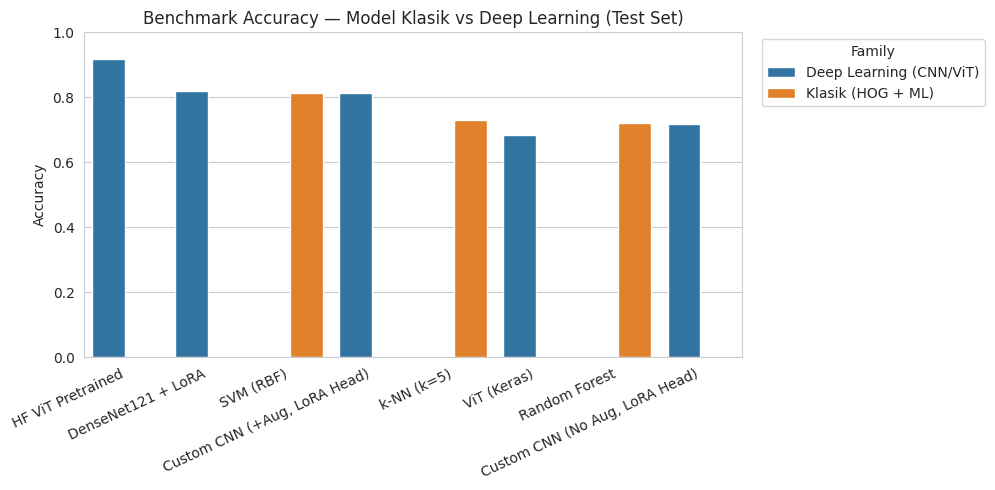

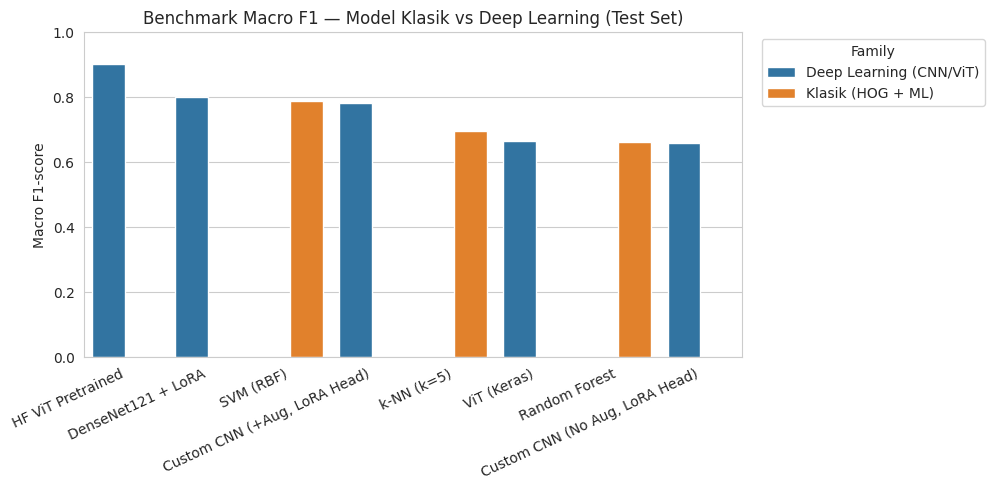

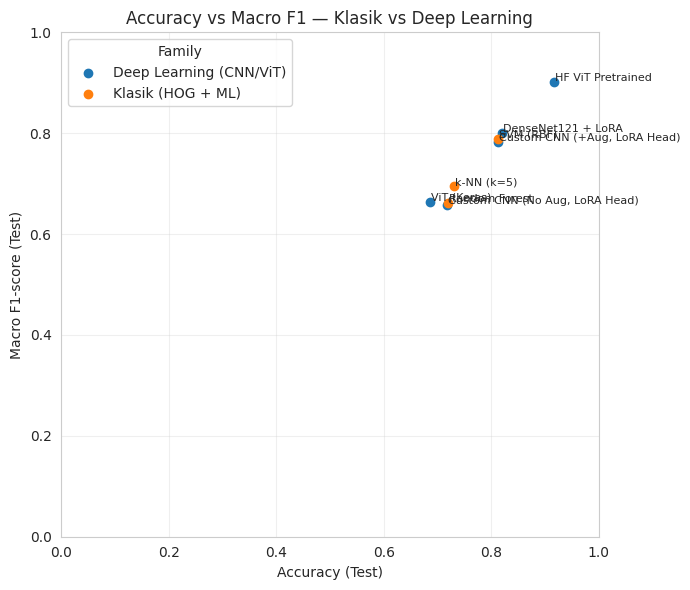

In [35]:
# %%
# ==========================================
# 26. BENCHMARK GABUNGAN:
#     MODEL KLASIK (HOG+ML) vs DEEP LEARNING
# ==========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

sns.set_style("whitegrid")

ARTIFACTS = Path("./artifacts")
VIZ_METRICS = ARTIFACTS / "viz_metrics"
VIZ_METRICS.mkdir(parents=True, exist_ok=True)

# ---------------------------------------------------
# 1. LOAD BENCHMARK DEEP LEARNING (dari classification_report_*.csv)
#    -> sama spirit-nya dengan Cell 25
# ---------------------------------------------------
csv_files = sorted(ARTIFACTS.glob("classification_report*.csv"))
print("📂 classification_report (deep models) yang ditemukan:")
for p in csv_files:
    print(" -", p.name)

if not csv_files:
    raise RuntimeError("Tidak ada classification_report*.csv. Pastikan semua model deep sudah dievaluasi & menyimpan report.")

# Mapping EXPLICIT: nama file -> (model_id, label enak)
name_map_deep = {
    "classification_report_custom_lora_noaug.csv": (
        "custom_cnn_noaug",
        "Custom CNN (No Aug, LoRA Head)",
    ),
    "classification_report_custom_lora_aug.csv": (
        "custom_cnn_aug",
        "Custom CNN (+Aug, LoRA Head)",
    ),
    "classification_report_lora_densenet.csv": (
        "lora_densenet121",
        "DenseNet121 + LoRA",
    ),
    "classification_report_vit_keras.csv": (
        "vit_keras",
        "ViT (Keras)",
    ),
    "classification_report_hf_vit_pretrained.csv": (
        "hf_vit_pretrained",
        "HF ViT Pretrained",
    ),
    # fallback kalau ada 1 file generic
    "classification_report.csv": (
        "custom_cnn_lora_aug",
        "Custom CNN (LoRA) + Aug",
    ),
}

class_names = list(CLASSES.values())  # {0:"COVID-19",1:"Non-COVID",2:"Normal"}

deep_rows = []

for path in csv_files:
    fname = path.name
    if fname not in name_map_deep:
        # kita treat sebagai model deep juga, tapi nama auto
        model_id = fname.replace("classification_report_", "").replace(".csv", "")
        pretty = model_id.replace("_", " ").title()
    else:
        model_id, pretty = name_map_deep[fname]

    df = pd.read_csv(path, index_col=0)

    # akurasi (sklearn classification_report menyimpan di row "accuracy", kolom "precision")
    try:
        acc = float(df.loc["accuracy", "precision"])
    except KeyError:
        acc = float(df.loc["accuracy"].max())

    macro_f1 = float(df.loc["macro avg", "f1-score"])
    weighted_f1 = float(df.loc["weighted avg", "f1-score"])

    deep_rows.append({
        "Family": "Deep Learning (CNN/ViT)",
        "Model ID": model_id,
        "Model": pretty,
        "Accuracy": acc,
        "Macro F1": macro_f1,
        "Weighted F1": weighted_f1,
    })

df_deep_bench = pd.DataFrame(deep_rows)
print("\n🧮 Ringkasan Deep Learning:")
display(df_deep_bench.round(4))

# ---------------------------------------------------
# 2. LOAD BENCHMARK MODEL KLASIK (SVM / RF / kNN)
#    dari metrics_df (Cell 7A) atau dari classic_models_metrics_*.csv
# ---------------------------------------------------
classic_csvs = sorted(VIZ_METRICS.glob("classic_models_metrics_*.csv"))

if "metrics_df" in globals():
    df_classic_metrics = metrics_df.copy()
    print("\n✅ Menggunakan metrics_df dari memori (Cell 7A).")
elif classic_csvs:
    latest_metrics = classic_csvs[-1]
    print("\n📄 Memuat metrics klasik dari file:", latest_metrics.name)
    df_classic_metrics = pd.read_csv(latest_metrics)
else:
    raise RuntimeError(
        "Tidak menemukan metrics klasik (classic_models_metrics_*.csv). "
        "Jalankan dulu Cell 7A untuk membuat ringkasan model klasik."
    )

# Hanya ambil split TEST
df_classic_test = df_classic_metrics[df_classic_metrics["split"] == "Test"].copy()

classic_name_map = {
    "svm_rbf": "SVM (RBF)",
    "random_forest": "Random Forest",
    "knn": "k-NN (k=5)",
}

df_classic_test["Model"] = df_classic_test["model"].map(classic_name_map).fillna(df_classic_test["model"])
df_classic_test["Family"] = "Klasik (HOG + ML)"
df_classic_test["Accuracy"] = df_classic_test["accuracy"]
df_classic_test["Macro F1"] = df_classic_test["f1_macro"]

df_classic_bench = df_classic_test[["Family", "Model", "Accuracy", "Macro F1"]].copy()
df_classic_bench["Weighted F1"] = np.nan  # opsional, tidak kita hitung di pipeline klasik

print("\n🧮 Ringkasan Model Klasik (Test):")
display(df_classic_bench.round(4))

# ---------------------------------------------------
# 3. GABUNGKAN BENCHMARK KLASIK + DEEP
# ---------------------------------------------------
df_all_bench = pd.concat(
    [
        df_classic_bench,
        df_deep_bench[["Family", "Model", "Accuracy", "Macro F1", "Weighted F1"]],
    ],
    ignore_index=True,
)

df_all_bench = df_all_bench.sort_values("Macro F1", ascending=False).reset_index(drop=True)

print("\n📊 BENCHMARK GABUNGAN (Klasik + Deep Learning) — urut dari Macro F1 tertinggi:")
display(df_all_bench.round(4))

# Simpan ke CSV
combined_csv_path = ARTIFACTS / "benchmark_combined_classic_vs_deep.csv"
df_all_bench.to_csv(combined_csv_path, index=False)
print(f"💾 Benchmark gabungan disimpan ke: {combined_csv_path}")

# ---------------------------------------------------
# 4. VISUALISASI: BARPLOT ACCURACY & MACRO F1
# ---------------------------------------------------
plt.figure(figsize=(10, 5))
sns.barplot(
    data=df_all_bench,
    x="Model",
    y="Accuracy",
    hue="Family",
)
plt.title("Benchmark Accuracy — Model Klasik vs Deep Learning (Test Set)")
plt.ylim(0, 1.0)
plt.xticks(rotation=25, ha="right")
plt.ylabel("Accuracy")
plt.xlabel("")
plt.legend(title="Family", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
sns.barplot(
    data=df_all_bench,
    x="Model",
    y="Macro F1",
    hue="Family",
)
plt.title("Benchmark Macro F1 — Model Klasik vs Deep Learning (Test Set)")
plt.ylim(0, 1.0)
plt.xticks(rotation=25, ha="right")
plt.ylabel("Macro F1-score")
plt.xlabel("")
plt.legend(title="Family", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()

# ---------------------------------------------------
# 5. (Opsional) SCATTER: Accuracy vs Macro F1
# ---------------------------------------------------
plt.figure(figsize=(7, 6))
for fam, sub in df_all_bench.groupby("Family"):
    plt.scatter(sub["Accuracy"], sub["Macro F1"], label=fam)
    for _, row in sub.iterrows():
        plt.text(
            row["Accuracy"] + 0.002,
            row["Macro F1"] + 0.002,
            row["Model"],
            fontsize=8,
        )

plt.xlabel("Accuracy (Test)")
plt.ylabel("Macro F1-score (Test)")
plt.title("Accuracy vs Macro F1 — Klasik vs Deep Learning")
plt.xlim(0, 1.0)
plt.ylim(0, 1.0)
plt.grid(alpha=0.3)
plt.legend(title="Family")
plt.tight_layout()
plt.show()


In [36]:
!pip install streamlit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 84.3 MB/s eta 0:00:00:00:01:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 121.9 MB/s eta 0:00:0000:01


In [37]:
%%writefile app.py
import streamlit as st
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import torch
import pickle
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from skimage.feature import hog
from PIL import Image
from tensorflow.keras import layers, models
from transformers import AutoImageProcessor, ViTForImageClassification

# ==========================================
# 1. KONFIGURASI HALAMAN & CSS
# ==========================================
st.set_page_config(
    page_title="Ultimate COVID-19 AI Dashboard",
    page_icon="🧬",
    layout="wide",
    initial_sidebar_state="expanded"
)

# Custom CSS untuk tampilan Modern & Clean
st.markdown("""
    <style>
    .main { background-color: #f8f9fa; }
    h1 { color: #2c3e50; font-family: 'Helvetica Neue', sans-serif; }
    h2, h3 { color: #34495e; }
    .stButton>button {
        background: linear-gradient(90deg, #4b6cb7 0%, #182848 100%);
        color: white;
        border: none;
        border-radius: 8px;
        height: 50px;
        font-weight: bold;
        transition: all 0.3s ease;
    }
    .stButton>button:hover {
        transform: scale(1.02);
        box-shadow: 0 4px 15px rgba(0,0,0,0.2);
    }
    .metric-card {
        background: white;
        padding: 20px;
        border-radius: 12px;
        border-left: 5px solid #4b6cb7;
        box-shadow: 0 4px 6px rgba(0,0,0,0.05);
        text-align: center;
        margin-bottom: 10px;
    }
    .metric-value { font-size: 24px; font-weight: bold; color: #2c3e50; }
    .metric-label { font-size: 14px; color: #7f8c8d; text-transform: uppercase; letter-spacing: 1px; }
    .prediction-box {
        padding: 15px;
        border-radius: 10px;
        color: white;
        font-weight: bold;
        text-align: center;
        margin-top: 10px;
    }
    .pred-covid { background-color: #e74c3c; }
    .pred-non { background-color: #f39c12; }
    .pred-normal { background-color: #27ae60; }
    </style>
    """, unsafe_allow_html=True)

# ==========================================
# 2. KONSTANTA & CONFIG
# ==========================================
CLASSES = {0: "COVID-19", 1: "Non-COVID", 2: "Normal"}
TARGET_SIZE = (224, 224)
ARTIFACTS_PATH = "./artifacts"

# ==========================================
# 3. KELAS KUSTOM KERAS (Wajib untuk Load Model)
# ==========================================
@tf.keras.utils.register_keras_serializable()
class LoRADense(layers.Layer):
    def __init__(self, units, rank=8, activation=None, **kwargs):
        super().__init__(**kwargs)
        self.units = units
        self.rank = rank
        self.activation = tf.keras.activations.get(activation)
    def build(self, input_shape):
        dim = input_shape[-1]
        self.kernel_frozen = self.add_weight(name="kernel_frozen", shape=(dim, self.units), initializer="glorot_uniform", trainable=False)
        self.lora_A = self.add_weight(name="lora_A", shape=(dim, self.rank), initializer="he_uniform", trainable=True)
        self.lora_B = self.add_weight(name="lora_B", shape=(self.rank, self.units), initializer="zeros", trainable=True)
        self.bias = self.add_weight(name="bias", shape=(self.units,), initializer="zeros", trainable=True)
    def call(self, inputs):
        return tf.matmul(inputs, self.kernel_frozen) + tf.matmul(tf.matmul(inputs, self.lora_A), self.lora_B) + self.bias
    def get_config(self):
        config = super().get_config()
        config.update({"units": self.units, "rank": self.rank})
        return config

@tf.keras.utils.register_keras_serializable()
class Patches(layers.Layer):
    def __init__(self, patch_size=16, **kwargs):
        super().__init__(**kwargs)
        self.patch_size = patch_size
    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(images=images, sizes=[1, self.patch_size, self.patch_size, 1], strides=[1, self.patch_size, self.patch_size, 1], rates=[1, 1, 1, 1], padding="VALID")
        return tf.reshape(patches, (batch_size, -1, patches.shape[-1]))
    def get_config(self):
        config = super().get_config()
        config.update({"patch_size": self.patch_size})
        return config

@tf.keras.utils.register_keras_serializable()
class PatchEncoder(layers.Layer):
    def __init__(self, num_patches=196, projection_dim=64, **kwargs):
        super().__init__(**kwargs)
        self.num_patches = num_patches
        self.projection_dim = projection_dim
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(input_dim=num_patches, output_dim=projection_dim)
    def call(self, patch):
        return self.projection(patch) + self.position_embedding(tf.range(start=0, limit=self.num_patches, delta=1))
    def get_config(self):
        config = super().get_config()
        config.update({"num_patches": self.num_patches, "projection_dim": self.projection_dim})
        return config

# ==========================================
# 4. FUNGSI PREPROCESSING & FEATURE EXTRACTION
# ==========================================
def apply_clahe(img01):
    u8 = (img01 * 255).astype(np.uint8)
    return cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(u8).astype(np.float32) / 255.0

def heuristic_lung_crop(img01, padding=20):
    H, W = img01.shape
    u8 = (img01 * 255).astype(np.uint8)
    _, m = cv2.threshold(u8, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    num, lab = cv2.connectedComponents(m)
    if num <= 1: return cv2.resize(img01, TARGET_SIZE, interpolation=cv2.INTER_AREA)
    areas = sorted([(k, int((lab == k).sum())) for k in range(1, num)], key=lambda x: x[1], reverse=True)[:2]
    mask = np.zeros_like(m, dtype=np.uint8)
    for k, _ in areas: mask[lab == k] = 255
    ys, xs = np.where(mask > 0)
    if len(xs) == 0: return cv2.resize(img01, TARGET_SIZE, interpolation=cv2.INTER_AREA)
    x0, x1 = max(0, xs.min() - padding), min(W - 1, xs.max() + padding)
    y0, y1 = max(0, ys.min() - padding), min(H - 1, ys.max() + padding)
    return cv2.resize(img01[y0:y1+1, x0:x1+1], TARGET_SIZE, interpolation=cv2.INTER_AREA)

def preprocess_image(image_file):
    """
    Mengembalikan:
    1. img_vis: Gambar 224x224 untuk visualisasi (float 0-1)
    2. img_rgb_batch: Batch (1, 224, 224, 3) untuk DenseNet/HF ViT
    3. img_gray_batch: Batch (1, 224, 224, 1) untuk CNN/Keras ViT
    4. features_hog: Feature vector untuk model klasik
    """
    file_bytes = np.asarray(bytearray(image_file.read()), dtype=np.uint8)
    img = cv2.imdecode(file_bytes, cv2.IMREAD_GRAYSCALE)
    if img is None: return None
    
    # Image Processing Pipeline
    img = cv2.resize(img, TARGET_SIZE, interpolation=cv2.INTER_AREA)
    img = img.astype(np.float32) / 255.0
    img = apply_clahe(img)
    img_vis = heuristic_lung_crop(img)
    
    # Prepare Batches
    img_gray_batch = np.expand_dims(img_vis[..., np.newaxis], axis=0)
    img_rgb_batch = np.repeat(img_gray_batch, 3, axis=-1)
    
    # Feature Extraction HOG (Classic)
    img_uint8 = (img_vis * 255).astype(np.uint8)
    features_hog = hog(
        img_uint8,
        pixels_per_cell=(16, 16),
        cells_per_block=(2, 2),
        orientations=9,
        feature_vector=True
    ).reshape(1, -1)
    
    return img_vis, img_rgb_batch, img_gray_batch, features_hog

# ==========================================
# 5. LOADING MODELS (CACHED)
# ==========================================
@st.cache_resource
def load_deep_models():
    models_dict = {}
    
    # 1. Keras Models
    try:
        models_dict["Custom CNN (No Aug)"] = tf.keras.models.load_model(
            os.path.join(ARTIFACTS_PATH, "best_custom_lora_noaug.h5"), 
            custom_objects={"LoRADense": LoRADense}
        )
        models_dict["Custom CNN (Augmented)"] = tf.keras.models.load_model(
            os.path.join(ARTIFACTS_PATH, "best_custom_lora_aug.h5"), 
            custom_objects={"LoRADense": LoRADense}
        )
        models_dict["ViT Keras"] = tf.keras.models.load_model(
            os.path.join(ARTIFACTS_PATH, "best_vit_model.h5"), 
            custom_objects={"Patches": Patches, "PatchEncoder": PatchEncoder}
        )
        models_dict["DenseNet121 LoRA"] = tf.keras.models.load_model(
            os.path.join(ARTIFACTS_PATH, "best_lora_densenet.h5"), 
            custom_objects={"LoRADense": LoRADense}
        )
    except Exception as e:
        st.error(f"Error loading Keras models: {e}")

    # 2. HF PyTorch Model
    try:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        hf_model = ViTForImageClassification.from_pretrained(
            "google/vit-base-patch16-224-in21k", num_labels=3, ignore_mismatched_sizes=True
        )
        hf_model.load_state_dict(torch.load(os.path.join(ARTIFACTS_PATH, "hf_vit_pretrained_best.pt"), map_location=device))
        hf_model.to(device).eval()
        hf_proc = AutoImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k")
        models_dict["HF ViT Pretrained"] = (hf_model, hf_proc, device)
    except Exception as e:
        st.error(f"Error loading HF Model: {e}")
        
    return models_dict

@st.cache_resource
def load_classic_pipeline():
    try:
        scaler = joblib.load(os.path.join(ARTIFACTS_PATH, "feature_scaler_classic.joblib"))
        selector = joblib.load(os.path.join(ARTIFACTS_PATH, "feature_selector_classic.joblib"))
        
        cl_models = {}
        for name in ["svm_rbf", "random_forest", "knn"]:
            path = os.path.join(ARTIFACTS_PATH, "classic_models", f"{name}.joblib")
            if os.path.exists(path):
                cl_models[name] = joblib.load(path)
        
        return scaler, selector, cl_models
    except Exception as e:
        st.warning(f"Classic pipeline artifacts not found: {e}")
        return None, None, None

@st.cache_resource
def load_histories():
    hist_files = {
        "Custom CNN (No Aug)": "history_custom_lora_noaug.pkl",
        "Custom CNN (Augmented)": "history_custom_lora_aug.pkl",
        "DenseNet121 LoRA": "history_lora_densenet.pkl",
        "ViT Keras": "history_vit.pkl",
        "HF ViT Pretrained": "history_hf_vit_pretrained.pkl"
    }
    histories = {}
    for name, fname in hist_files.items():
        path = os.path.join(ARTIFACTS_PATH, fname)
        if os.path.exists(path):
            with open(path, "rb") as f:
                histories[name] = pickle.load(f)
    return histories

# Load resources once
deep_models = load_deep_models()
scaler, selector, classic_models = load_classic_pipeline()
histories = load_histories()

# ==========================================
# 6. CORE LOGIC
# ==========================================
def get_prediction(model_key, model_obj, img_inputs):
    img_vis, img_rgb, img_gray, feats_hog = img_inputs
    probs = None
    
    # 1. Classic Models
    if model_key in ["svm_rbf", "random_forest", "knn"]:
        # Transform Features
        feats_sel = selector.transform(feats_hog)
        feats_scaled = scaler.transform(feats_sel)
        
        if hasattr(model_obj, "predict_proba"):
            probs = model_obj.predict_proba(feats_scaled)[0]
        else:
            # Fallback for models without proba (though SVM/RF usually have it)
            pred = model_obj.predict(feats_scaled)[0]
            probs = np.zeros(3)
            probs[pred] = 1.0

    # 2. HF ViT (PyTorch)
    elif model_key == "HF ViT Pretrained":
        hf_model, hf_proc, device = model_obj
        inputs = hf_proc(images=(img_rgb[0] * 255).astype(np.uint8), return_tensors="pt").to(device)
        with torch.no_grad():
            outputs = hf_model(**inputs)
            probs = torch.nn.functional.softmax(outputs.logits, dim=-1)[0].cpu().numpy()

    # 3. Keras RGB Models
    elif model_key == "DenseNet121 LoRA":
        probs = model_obj.predict(img_rgb, verbose=0)[0]
        
    # 4. Keras Gray Models
    else:
        probs = model_obj.predict(img_gray, verbose=0)[0]
        
    return probs

# ==========================================
# 7. UI LAYOUT
# ==========================================

# --- SIDEBAR ---
st.sidebar.image("https://img.icons8.com/clouds/200/lung.png", width=100)
st.sidebar.title("Navigasi")
app_mode = st.sidebar.radio("Pilih Mode:", ["🖼️ Deteksi & Analisis", "📈 Training Metrics & Graphs"])

# --- PAGE 1: DETEKSI & ANALISIS ---
if app_mode == "🖼️ Deteksi & Analisis":
    st.title("🖼️ Deteksi COVID-19 Multi-Model")
    st.markdown("Upload X-Ray Anda dan jalankan analisis menggunakan **Machine Learning Klasik** dan **Deep Learning**.")
    
    # Input Area
    col_input, col_vis = st.columns([1, 1.5])
    
    with col_input:
        uploaded_file = st.file_uploader("📂 Upload X-Ray Image", type=["jpg", "png", "jpeg"])
        
        # Mode Seleksi
        run_mode = st.radio(
            "⚙️ Mode Eksekusi:",
            ["Single Model", "All Classic ML", "All Deep Learning", "⚡ RUN EVERYTHING"]
        )
        
        selected_model = None
        if run_mode == "Single Model":
            all_options = list(deep_models.keys()) + (list(classic_models.keys()) if classic_models else [])
            selected_model = st.selectbox("Pilih Model:", all_options)

    # Process Upload
    if uploaded_file:
        inputs = preprocess_image(uploaded_file)
        if inputs:
            img_vis, _, _, _ = inputs
            with col_vis:
                st.image(img_vis, caption="Processed Image (CLAHE + Lung Crop)", width=350, clamp=True, channels='GRAY')
                
            if st.button("🚀 JALANKAN ANALISIS", use_container_width=True):
                st.divider()
                st.subheader("📊 Hasil Analisis")
                
                results_list = []
                
                # Logic Runner
                models_to_run = {}
                
                if run_mode == "Single Model":
                    if selected_model in deep_models:
                        models_to_run[selected_model] = deep_models[selected_model]
                    elif classic_models and selected_model in classic_models:
                        models_to_run[selected_model] = classic_models[selected_model]
                        
                elif run_mode == "All Classic ML":
                    if classic_models: models_to_run = classic_models
                    else: st.error("Model Klasik tidak ditemukan.")
                    
                elif run_mode == "All Deep Learning":
                    models_to_run = deep_models
                    
                elif run_mode == "⚡ RUN EVERYTHING":
                    models_to_run = {**deep_models, **(classic_models if classic_models else {})}

                # Execution Loop
                prog_bar = st.progress(0)
                for i, (name, model) in enumerate(models_to_run.items()):
                    probs = get_prediction(name, model, inputs)
                    pred_idx = np.argmax(probs)
                    conf = probs[pred_idx]
                    
                    results_list.append({
                        "Model": name,
                        "Prediksi": CLASSES[pred_idx],
                        "Confidence": conf,
                        "Prob COVID": probs[0],
                        "Prob Non-COVID": probs[1],
                        "Prob Normal": probs[2]
                    })
                    prog_bar.progress((i + 1) / len(models_to_run))
                
                # --- VISUALIZATION OF RESULTS ---
                df_res = pd.DataFrame(results_list).sort_values("Confidence", ascending=False)
                
                # 1. Best Result Highlight
                best_model = df_res.iloc[0]
                label_color = "pred-covid" if best_model['Prediksi'] == "COVID-19" else "pred-non" if best_model['Prediksi'] == "Non-COVID" else "pred-normal"
                
                col_best1, col_best2 = st.columns([1, 2])
                with col_best1:
                    st.markdown(f"""
                    <div class="metric-card">
                        <div class="metric-label">Konsensus Terbaik</div>
                        <div class="prediction-box {label_color}">{best_model['Prediksi']}</div>
                        <div class="metric-value">{best_model['Confidence']:.2%}</div>
                        <small>by {best_model['Model']}</small>
                    </div>
                    """, unsafe_allow_html=True)
                
                with col_best2:
                    st.write("#### 📈 Perbandingan Probabilitas Semua Model")
                    # Stacked bar chart for detailed probs
                    df_chart = df_res.set_index("Model")[["Prob COVID", "Prob Non-COVID", "Prob Normal"]]
                    st.bar_chart(df_chart, height=250)

                # 2. Detailed Table
                st.write("#### 📋 Tabel Detail")
                st.dataframe(
                    df_res.style.background_gradient(subset=["Confidence"], cmap="Greens")
                          .format({"Confidence": "{:.2%}", "Prob COVID": "{:.2%}", "Prob Non-COVID": "{:.2%}", "Prob Normal": "{:.2%}"}),
                    use_container_width=True
                )

# --- PAGE 2: TRAINING METRICS ---
elif app_mode == "📈 Training Metrics & Graphs":
    st.title("📈 Performance Metrics & Training History")
    
    tab1, tab2 = st.tabs(["📉 Training Curves (Loss/Acc)", "📑 Evaluation Reports"])
    
    with tab1:
        st.markdown("Pilih model untuk melihat grafik **Accuracy** dan **Loss** selama proses training.")
        model_hist_choice = st.selectbox("Pilih Model:", list(histories.keys()))
        
        if model_hist_choice:
            hist = histories[model_hist_choice]
            
            # Extract data
            acc = hist.get('accuracy', hist.get('train_acc', []))
            val_acc = hist.get('val_accuracy', hist.get('val_acc', []))
            loss = hist.get('loss', hist.get('train_loss', []))
            val_loss = hist.get('val_loss', hist.get('val_loss', []))
            epochs = range(1, len(acc) + 1)
            
            col_g1, col_g2 = st.columns(2)
            
            # Plot Accuracy
            with col_g1:
                fig1, ax1 = plt.subplots(figsize=(6, 4))
                ax1.plot(epochs, acc, 'b-o', label='Training Acc')
                ax1.plot(epochs, val_acc, 'r-o', label='Validation Acc')
                ax1.set_title(f"Accuracy Curve: {model_hist_choice}")
                ax1.set_xlabel("Epochs")
                ax1.set_ylabel("Accuracy")
                ax1.legend()
                ax1.grid(True, alpha=0.3)
                st.pyplot(fig1)
                
            # Plot Loss
            with col_g2:
                fig2, ax2 = plt.subplots(figsize=(6, 4))
                ax2.plot(epochs, loss, 'b-o', label='Training Loss')
                ax2.plot(epochs, val_loss, 'r-o', label='Validation Loss')
                ax2.set_title(f"Loss Curve: {model_hist_choice}")
                ax2.set_xlabel("Epochs")
                ax2.set_ylabel("Loss")
                ax2.legend()
                ax2.grid(True, alpha=0.3)
                st.pyplot(fig2)
                
            st.info(f"Final Validation Accuracy: **{val_acc[-1]:.2%}** | Final Validation Loss: **{val_loss[-1]:.4f}**")

    with tab2:
        st.markdown("### Laporan Klasifikasi (Test Set)")
        # Load CSVs from artifacts
        import glob
        report_files = glob.glob(os.path.join(ARTIFACTS_PATH, "classification_report*.csv"))
        
        if report_files:
            selected_report = st.selectbox("Pilih Laporan:", [os.path.basename(f) for f in report_files])
            df_rep = pd.read_csv(os.path.join(ARTIFACTS_PATH, selected_report), index_col=0)
            st.dataframe(df_rep.style.format("{:.4f}"))
        else:
            st.warning("Belum ada file classification report yang ditemukan di folder artifacts.")

# Footer
st.markdown("---")
st.markdown("<center><small>Developed with ❤️ using Streamlit, TensorFlow, PyTorch & Scikit-Learn</small></center>", unsafe_allow_html=True)

Writing app.py


In [ ]:
# !npm install localtunnel

# # !wget -q -O - ipv4.icanhazip.com

In [ ]:
# 1. Install pyngrok (Wrapper python untuk ngrok)
!pip install -q pyngrok

import subprocess
import time
import os
import sys
from pyngrok import ngrok, conf

# ==========================================
# KONFIGURASI NGROK
# ==========================================

NGROK_AUTH_TOKEN = "36Ji0NT24iwsflxZuDX4u3y9qoU_75LLUACBt1CsjvdbCdzae" 

if NGROK_AUTH_TOKEN == "MASUKKAN_TOKEN_NGROK_DISINI":
    print("❌ ERROR: Anda belum memasukkan Authtoken Ngrok!")
    print("   Silakan ambil di: https://dashboard.ngrok.com/get-started/your-authtoken")
else:
    # Set token dan konfigurasi region
    conf.get_default().auth_token = NGROK_AUTH_TOKEN
    
    # Bungkus dalam try-except agar tidak ada error merah saat Stop
    try:
        # 1. Bersihkan proses lama
        print("🧹 Membersihkan proses lama...")
        ngrok.kill() # Matikan tunnel ngrok lama
        os.system("pkill -f streamlit")
        time.sleep(1)

        # 2. Jalankan Streamlit di Background
        print("🚀 Menjalankan Streamlit App...")
        # Simpan log ke file agar cell bersih
        with open("streamlit_logs.txt", "w") as log_file:
            subprocess.Popen(
                ["streamlit", "run", "app.py"],
                stdout=log_file,
                stderr=log_file
            )
        time.sleep(3) # Tunggu booting

        # 3. Buat Tunnel ke Port 8501
        print("🔗 Menghubungkan ke Ngrok...")
        public_url = ngrok.connect(8501).public_url

        print("\n" + "="*50)
        print(f"✅ DASHBOARD SIAP! Klik link di bawah ini:")
        print(f"   👉 {public_url}")
        print("="*50)
        print("\nℹ️  Website SUDAH JALAN.")
        print("ℹ️  Tekan tombol STOP (kotak) jika ingin mematikan.")

        # 4. Keep Alive Loop
        while True:
            time.sleep(1)

    except KeyboardInterrupt:
        print("\n\n✅ Cell dihentikan manual oleh User.")
        print("   Ngrok tunnel dimatikan.")
        ngrok.kill()

🧹 Membersihkan proses lama...
🚀 Menjalankan Streamlit App...
🔗 Menghubungkan ke Ngrok...
                                                                                                    
✅ DASHBOARD SIAP! Klik link di bawah ini:
   👉 https://lizbeth-miraculous-overapprehensively.ngrok-free.dev

ℹ️  Website SUDAH JALAN.
ℹ️  Tekan tombol STOP (kotak) jika ingin mematikan.
